In [1]:
import sys
sys.path.insert(0, '/home/ggorin/projects/monod/src/')

In [2]:
import monod
from monod import preprocess, extract_data, cme_toolbox, inference, analysis

In [3]:
import pandas as pd
import numpy as np
import loompy as lp
import matplotlib.pyplot as plt
import scipy

In [67]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
meta_path = "/home/tchari/metadata/"
meta = pd.read_csv(meta_path+'norman_GSE133344_filtered_cell_identities.csv')

#'guide_identity'

In [5]:
dataset_meta = ['allcrispr']
print('dataset_meta: ', dataset_meta)
print()

subcluster_names = [['DUSP9_MAPK1__DUSP9_MAPK1'],['ETS2_MAPK1__ETS2_MAPK1'],['MAPK1_NegCtrl0__MAPK1_NegCtrl0','NegCtrl0_MAPK1__NegCtrl0_MAPK1'],
                    ['NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0'],['NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0'],
                   ['NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0'],['NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0'],
                   ['DUSP9_ETS2__DUSP9_ETS2'],['NegCtrl0_ETS2__NegCtrl0_ETS2','ETS2_NegCtrl0__ETS2_NegCtrl0'],
                   ['DUSP9_NegCtrl0__DUSP9_NegCtrl0'],['CBL_NegCtrl0__CBL_NegCtrl0'],['CBL_CNN1__CBL_CNN1'],
                   ['NegCtrl0_CNN1__NegCtrl0_CNN1','CNN1_NegCtrl0__CNN1_NegCtrl0'],
                   ['NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0','NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0',
                    'NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0']]

sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['norman_'+dataset_meta[0]+'_'+y  for y in sub_names_only]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

raw_data_locations = [dataset_meta[0] for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200525_genome_polyA_cum_3'

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/norman_crispr/loom/'+x+'.loom' for x in raw_data_locations] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

dataset_meta:  ['allcrispr']

dataset_names:  ['norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1', 'norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1', 'norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1', 'norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0', 'norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0', 'norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0', 'norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0', 'norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2', 'norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0', 'norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0', 'norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0', 'norman_allcrispr_CBL_CNN1__CBL_CNN1', 'norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0', 'norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0']
len(dataset_names):  14

loom_filepaths:  ['/home/tchari/counts/norman_crispr/lo

## **Cell Preprocessing**

Filter cell barcodes with low UMI counts and overlap with published annotations

Dataset allcrispr. 
	116844 barcodes in loom, 94649 pass filter. TTGAACGAGACTCGGA-2CGTTGGGGTGTTTGTG-7GAACCTAAGTGTTAGA-6CCTTCCCTCCGTCATC-4TCAATCTGTCTTTCAT-2TCCCGATGTCTCTTAT-8AAACCTGTCCAGAAGG-2CTGCCTAGTTCCACAA-4GAACCTATCCAGAAGG-3AAGCCGCTCACTCCTG-5TTCTTAGCATGGGAAC-7GACGGCTTCGTCACGG-1TGCGGGTCATTCACTT-8GGACAAGGTAGGGACT-5CGCGGTAGTGAGTATA-8CTGATAGTCACAGGCC-3ACGGAGACAATGGATA-5CATGGCGGTATATGAG-5ACATGGTGTCCAGTAT-5GACCAATTCAACACAC-4AACACGTCATTCTTAC-4CTAGCCTTCAACACGT-4GAACCTAAGCTCTCGG-5GCGCCAAGTGTGACCC-6CGCGGTAAGATAGTCA-1CGTTAGAGTTCGTGAT-8TGCTACCAGCGATTCT-5CGGTTAATCTTCTGGC-5AGACGTTGTCTAGCGC-2TTGGAACTCAAGCCTA-7TCAATCTCATTGAGCT-5CTAACTTCAGACGCTC-5CAACCTCAGGCGACAT-5AGACGTTGTCAAACTC-5CCAATCCAGTCAAGCG-5TACGGATTCGGATGGA-5ACGCCAGTCATCTGCC-5CAGCTGGGTTCGTTGA-4TCGGGACCAATAGCGG-1AACCATGTCTCTGAGA-5ATTATCCAGCGTGTCC-5TATCAGGCAAGCGATG-5AACCGCGCATTGGTAC-3GCGCAGTGTCCAAGTT-5TTGGAACCAGGGAGAG-7ATGCGATAGTACGCGA-5GCGCCAACACACCGCA-8AACGTTGAGCGTAGTG-1CAGCATATCTCAACTT-2TCCCGATGTAAACGCG-5ATGAGGGCATTGGCGC-2TAGGCATCACAGAGGT-

	['DUSP9_MAPK1__DUSP9_MAPK1']: 290 cells in annotations. 290 in loom. 260 pass filter.
	['ETS2_MAPK1__ETS2_MAPK1']: 459 cells in annotations. 459 in loom. 321 pass filter.
	['MAPK1_NegCtrl0__MAPK1_NegCtrl0', 'NegCtrl0_MAPK1__NegCtrl0_MAPK1']: 765 cells in annotations. 765 in loom. 671 pass filter.
	['NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0']: 3532 cells in annotations. 3532 in loom. 3255 pass filter.
	['NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0']: 2839 cells in annotations. 2839 in loom. 2622 pass filter.
	['NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0']: 2948 cells in annotations. 2948 in loom. 2679 pass filter.
	['NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0']: 2536 cells in annotations. 2536 in loom. 2362 pass filter.
	['DUSP9_ETS2__DUSP9_ETS2']: 787 cells in annotations. 787 in loom. 634 pass filter.
	['NegCtrl0_ETS2__NegCtrl0_ETS2', 'ETS2_NegCtrl0__ETS2_NegCtrl0']: 1201 cells in annotations. 1201 in loom. 1085 pass filter.
	['DUSP9_NegCtrl0__DUSP9_NegCtrl0']: 731 cells in annotations. 731 in loom. 57

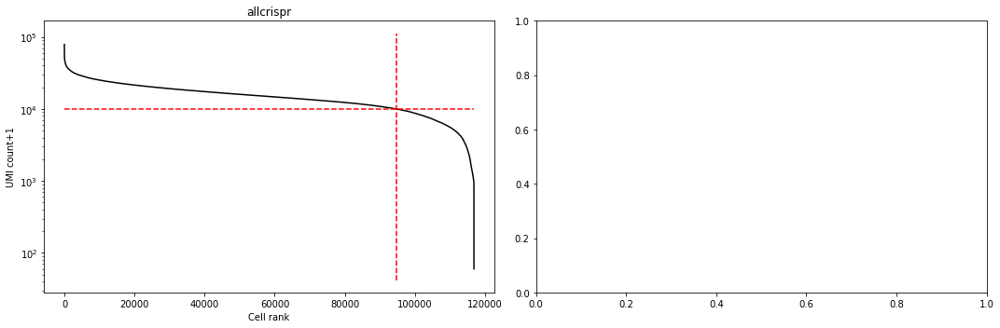

In [6]:
cf = []
thr_lb = [1e4]*len(dataset_meta)*2

fig1,ax1 = plt.subplots(1,len(dataset_meta)*2,figsize=(15,5))

for k in range(len(dataset_meta)):
    filename = loom_filepaths[len(subcluster_names)*k]
    dataset_name = raw_data_locations[len(subcluster_names)*k]
    
    with lp.connect(filename,mode='r') as ds:
        S = ds.layers[spliced_layer][:]
        U = ds.layers[unspliced_layer][:]
        gene_names = ds.ra[gene_attr]
        bcs = ds.ca[cell_attr]
        n_cells = S.shape[1]
        monod.preprocess.knee_plot(S+U,ax1[k],viz=True,thr=thr_lb[k])
        cf_ = ((S+U).sum(0)>thr_lb[k])
        
        n_annot_bcs = meta['cell_barcode'].sum()
        annot_bcs_in_loom = meta['cell_barcode'].isin(bcs).sum()
        annot_bcs_in_filt_loom = meta['cell_barcode'].isin(bcs[cf_]).sum()
        print(f'Dataset {dataset_name}. \n\t{len(bcs)} barcodes in loom, {cf_.sum()} pass filter. {n_annot_bcs} in annotations; of these, {annot_bcs_in_loom} in loom and {annot_bcs_in_filt_loom} in filtered loom.')
        
        #if k==0:
        for subcluster in subcluster_names:
            annot_bcs = meta[(meta['guide_identity'].isin(subcluster))]['cell_barcode']
            cf.append(np.isin(bcs,annot_bcs) & cf_)
            print(f'\t{subcluster}: {len(annot_bcs)} cells in annotations. {np.isin(bcs,annot_bcs).sum()} in loom. {cf[-1].sum()} pass filter.')



    ax1[k].set_title(dataset_name)
    
!mkdir ./figs    
fig_dir = './figs/'
fig_string = fig_dir + 'kneeplots_all.png'
fig1.tight_layout()
plt.savefig(fig_string,dpi=450)

In [11]:
print("Cells per subcluster: ", [x.sum() for x in cf])

Cells per subcluster:  [260, 321, 671, 3255, 2622, 2679, 2362, 634, 1085, 579, 604, 246, 675, 8239]


## **Gene Filtering**

Filter for genes with moderate expression across cells in dataset(s). 

In [6]:
import logging, sys
logging.basicConfig(stream=sys.stdout)
log = logging.getLogger()
log.setLevel(logging.INFO)

In [13]:
!mkdir ./fits

mkdir: cannot create directory ‘./fits’: File exists


INFO:root:Beginning data preprocessing and filtering.
INFO:root:Directory ./fits/gg_221010_024_norman_crispr_1 created.
INFO:root:Dataset: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
INFO:root:260 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:925 genes retained after expression filter.
INFO:root:Directory ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1 created.
INFO:root:Dataset: norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1
INFO:root:321 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:925 genes retained after expression filter.
INFO:root:Directory ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1 created.
INFO:root:Dataset: norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1
INFO:root:671 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were 

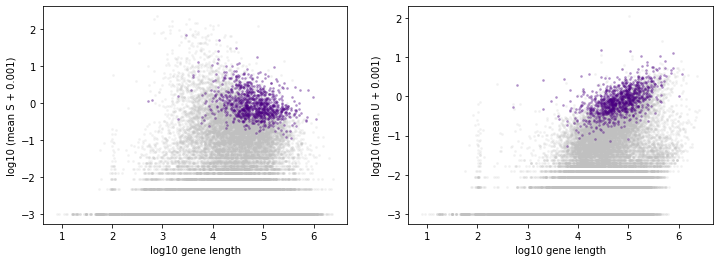

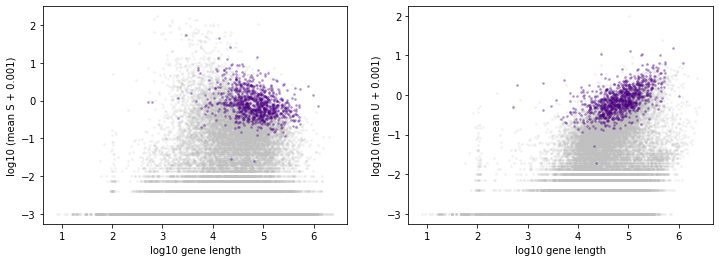

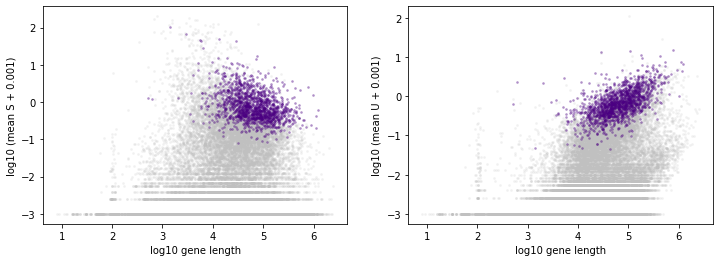

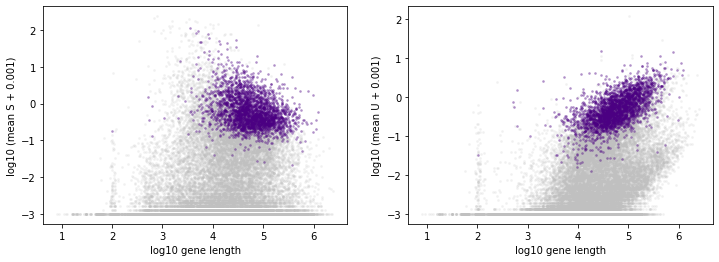

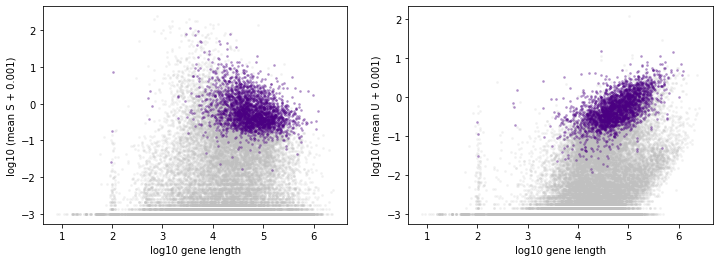

...

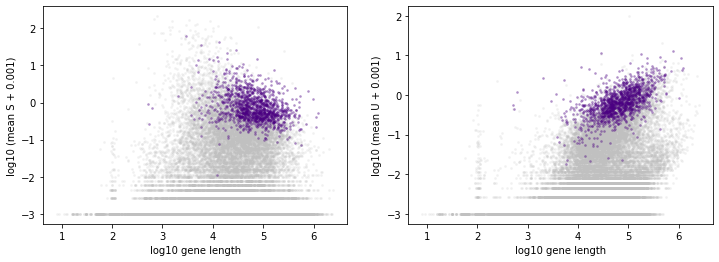

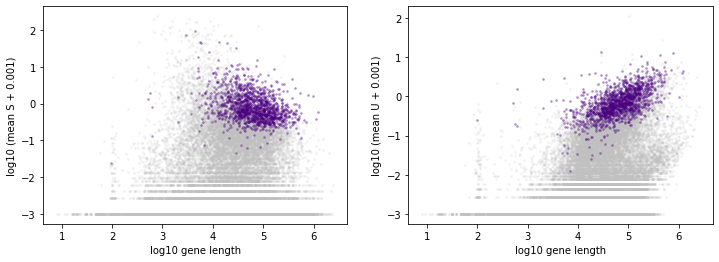

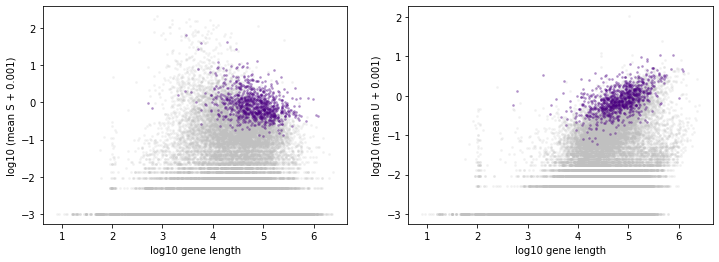

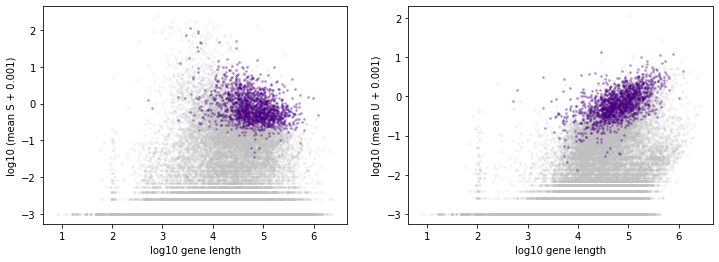

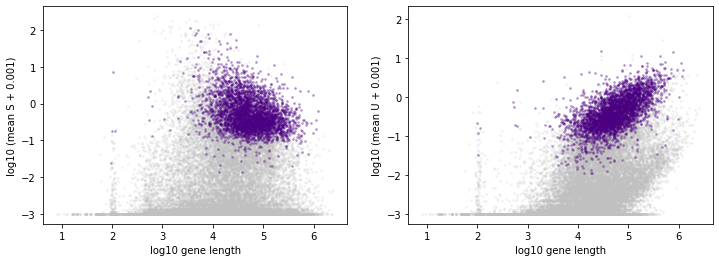

In [14]:
dir_string,dataset_strings = monod.preprocess.construct_batch(loom_filepaths, \
                                             transcriptome_filepath, \
                                             dataset_names, \
                                             attribute_names=attribute_names,\
                                             batch_location='./fits',meta='norman_crispr',batch_id=1,\
                                             n_genes=3000,exp_filter_threshold=None,cf=cf)

In [15]:
dir_string

'./fits/gg_221010_024_norman_crispr_1'

In [16]:
dataset_strings

['./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_

In [7]:
dir_string = './fits/gg_221010_024_norman_crispr_1'

In [8]:
dataset_strings = ['./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_CBL_CNN1__CBL_CNN1',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0',
 './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0']

## **Inference**
Run inference for each subcluster

In [9]:
#Define bounds
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-9, -4] #-7.5, -2
samp_ub = [-4, 1.5] #-5.5, 0
# gridsize = [5,6]
gridsize = [20,21]


In [ ]:
result_strings = []
for i in range(n_datasets):
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':5})
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, dataset_attr_names=attribute_names,cf=cf[i])
    full_result_string = inference_parameters.fit_all_grid_points(60,search_data)

    result_strings.append(full_result_string)

INFO:root:Directory ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_221010_024_norman_crispr_1/genes.csv.
INFO:root:Directory ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/raw.sd.
INFO:root:Starting parallelized grid scan.


 70%|█████████████████████████████████████████████████████████████████████████████████▍                                  | 295/420 [2:39:36<55:06, 26.45s/it]

In [ ]:
#All result files
result_strings

In [7]:
# result_strings = ['./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res',
#  './fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res']

In [10]:
result_strings = ['./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res', 
                  './fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res']

## **QC and Analysis of Results**

Look at optimum parameter fits, remove poorly fit genes, compute errors, save analyses

*STUDY does not use NegCtrl1_NegCtrl0

In [12]:
dir_string = './fits/gg_221010_024_norman_crispr_1' #'./fits/gg_221005_024_norman_crispr_0'

INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 1013 genes out of 3000. Runtime: 1.7 seconds.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_all

INFO:root:Gene 2562 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2576 ran into singularity; replaced with mean. (Search converged to local minimum?) 
INFO:root:Gene 2602 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2822 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2827 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2888 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2904 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2927 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2962 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2973 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures created.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 664 genes out of 3000. Runtime: 1.7 s

INFO:root:Gene 1832 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1922 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1928 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1935 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1957 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2030 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2096 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2114 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2118 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2127 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Standard error of the MLE computation complete. Runtime: 40.3 seconds.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MA

INFO:root:Gene 2434 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2535 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2536 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2562 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2589 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2626 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2639 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2697 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2737 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2748 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/ggorin/projects/monod/src/monod/inference.py:1000: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(nrows=1, ncols=num_params, figsize=figsize)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distri

INFO:root:Gene 1721 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1725 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1782 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1794 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1821 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1828 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1859 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1882 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1922 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1950 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Ch

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0

INFO:root:Gene 2491 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2510 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2530 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2557 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2579 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2584 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2621 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2626 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2751 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2879 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poiss

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-squ

INFO:root:Gene 2795 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2863 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2888 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2962 ran into singularity; replaced with mean. (Search converged to local minimum?) 
INFO:root:Gene 2987 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Standard error of the MLE computation complete. Runtime: 44.9 seconds.


/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 613 gene

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/analysis_figures/gene_distributions_joint.png.
INFO:root:Chi-square computation complete. Rejected 752 genes out of 3000. Runtime: 1.7 seconds.

INFO:root:Gene 1080 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1082 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1087 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1119 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1127 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1155 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1170 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1203 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1239 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1252 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Gene 2497 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2532 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2540 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2548 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2550 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2576 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2586 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2618 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2642 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2682 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_CBL_CNN1__CBL_CNN1/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_2

INFO:root:Gene 2927 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2962 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2973 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2975 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Standard error of the MLE computation complete. Runtime: 48.8 seconds.


/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/raw.sd.
INFO:root:No rejection statistics have been 

/home/ggorin/projects/monod/src/monod/inference.py:1301: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4156: RuntimeWarning: invalid value encountered in multiply
  return fac1 * sc.k1e(a * sq) * np.exp(b*x - a*sq) / sq
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_221005_024_norman_crispr_0/analysis_figures already exists.


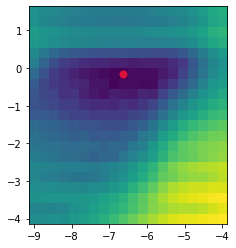

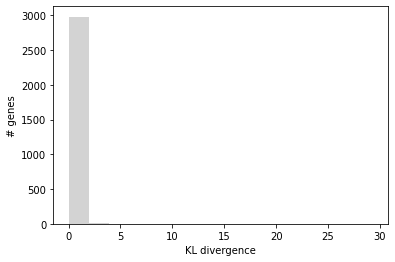

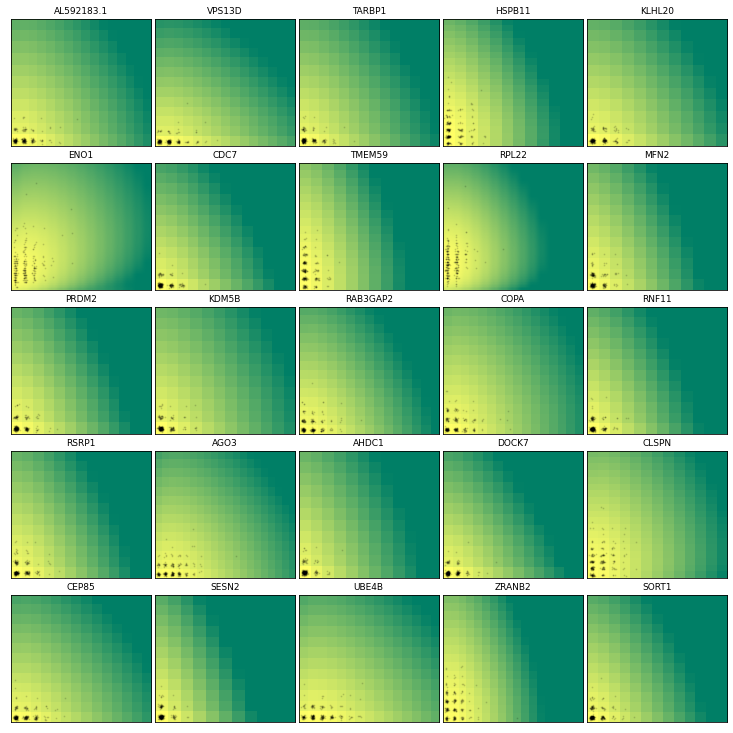

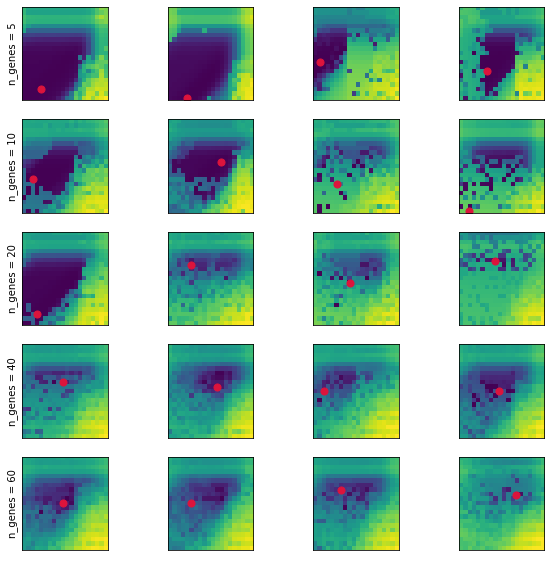

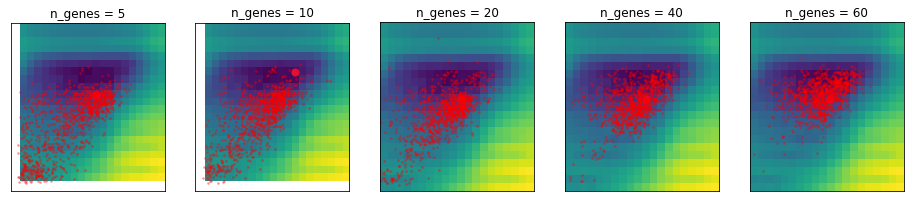

...

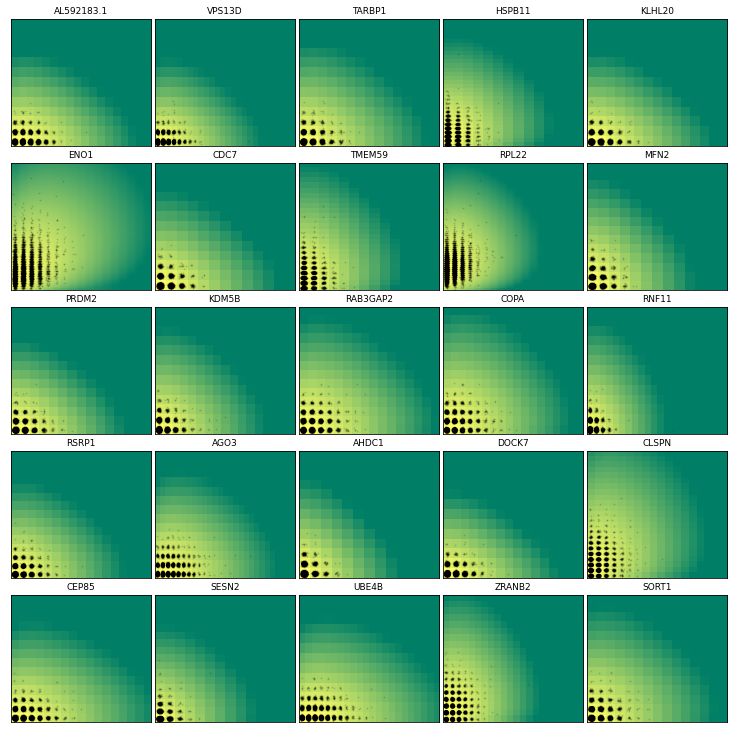

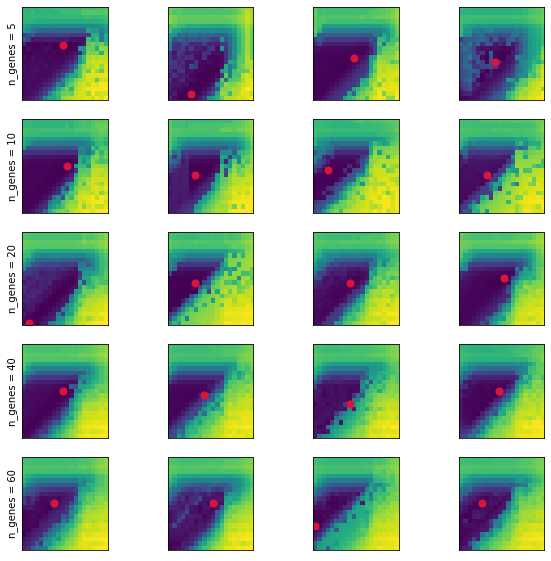

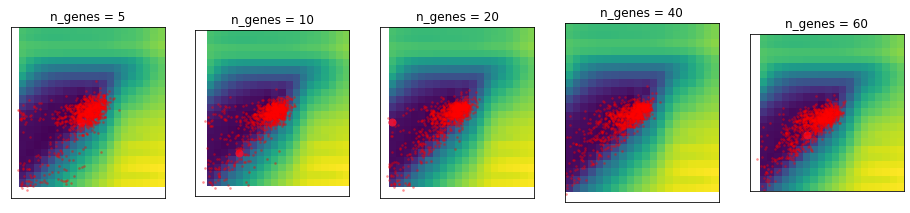

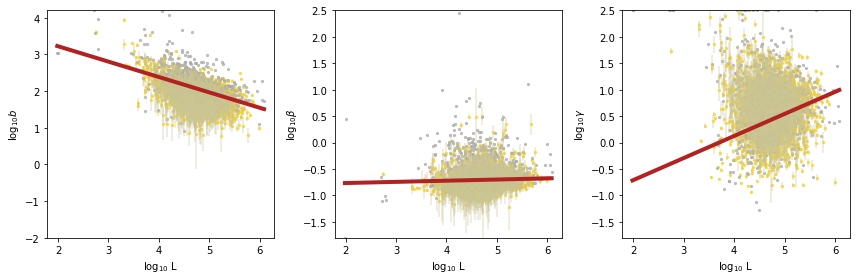

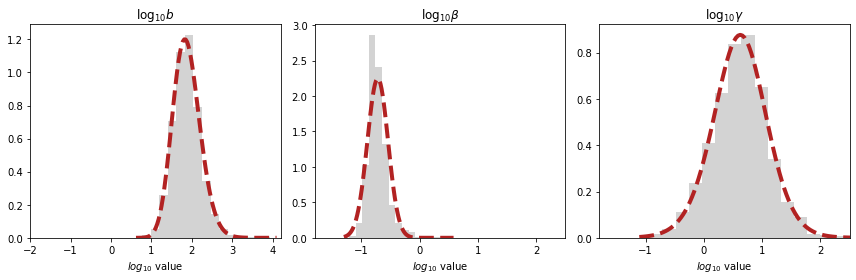

In [11]:
#Currently showing results for old run
for i in range(n_datasets):
    sr = monod.analysis.load_search_results(result_strings[i])
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.find_sampling_optimum()
    sr.plot_landscape(ax1)

    fig1,ax1 = plt.subplots(1,1)
    sr.plot_KL(ax1)

    sr.plot_gene_distributions(sd,marg='joint')

    _=sr.chisquare_testing(sd,threshold=1e-3)
    sr.resample_opt_viz()
    sr.resample_opt_mc_viz()
    sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

    sr.compute_sigma(sd,num_cores=60)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
    sr.plot_param_marg()
    
    monod.analysis.make_batch_analysis_dir([sr],dir_string)
    sr.update_on_disk()
    

In [14]:
sr.samp_optimum

(-7.684210526315789, -1.525)

In [13]:
#Read back in data
sr_arr = [monod.analysis.load_search_results(r[:-4]+'_upd.res') for r in result_strings]

INFO:root:Grid scan results loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl1

In [14]:
for i in range(len(dataset_names)):
    print(str(i)+': '+dataset_names[i])
  

0: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
1: norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1
2: norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1
3: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0
4: norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0
5: norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0
6: norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0
7: norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2
8: norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0
9: norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0
10: norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0
11: norman_allcrispr_CBL_CNN1__CBL_CNN1
12: norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0
13: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0


In [29]:
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    print(str(i)+': '+str(sr.samp_optimum))

0: (-7.157894736842105, -1.25)
1: (-6.631578947368421, -0.6999999999999997)
2: (-7.157894736842105, -0.9749999999999996)
3: (-7.684210526315789, -1.7999999999999998)
4: (-7.421052631578947, -1.7999999999999998)
5: (-7.421052631578947, -1.25)
6: (-6.894736842105264, -1.25)
7: (-7.157894736842105, -0.9749999999999996)
8: (-7.421052631578947, -0.9749999999999996)
9: (-6.368421052631579, -0.9749999999999996)
10: (-6.894736842105264, -0.9749999999999996)
11: (-7.157894736842105, -1.25)
12: (-7.684210526315789, -1.25)
13: (-6.894736842105264, -1.525)


(-7.157894736842105, -1.25)
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-6.631578947368421, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-7.157894736842105, -0.9749999999999996)
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-7.684210526315789, -1.7999999999999998)
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-7.421052631578947, -1.7999999999999998)
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtr

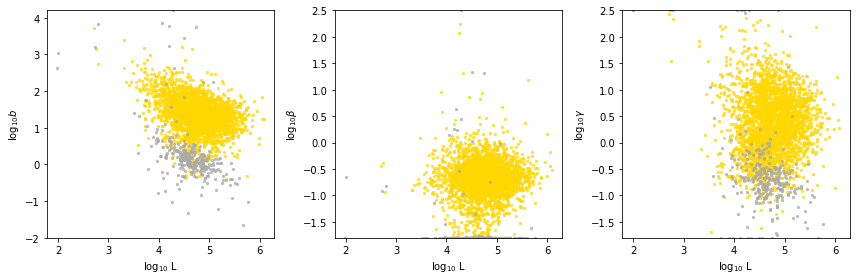

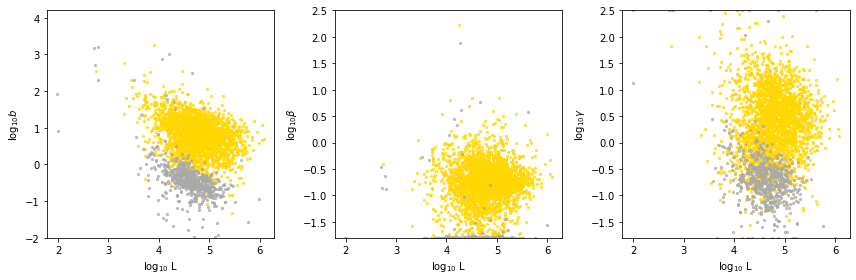

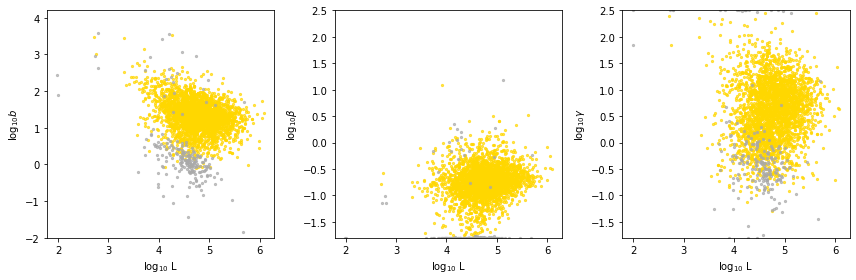

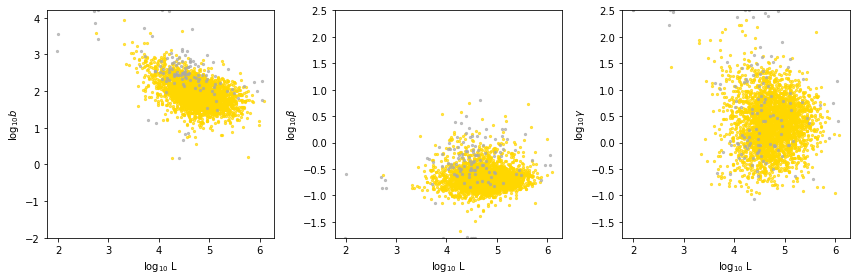

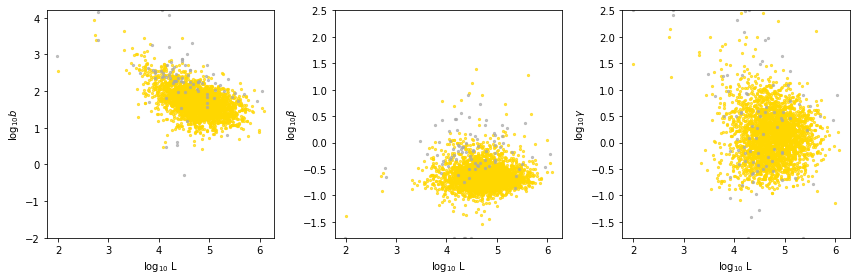

...

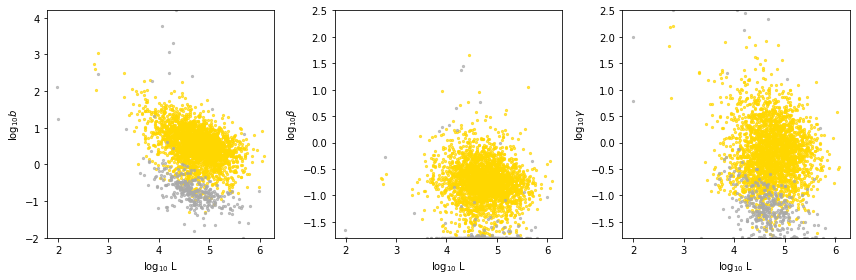

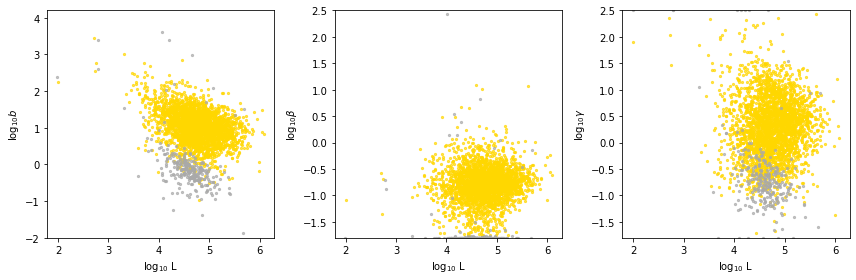

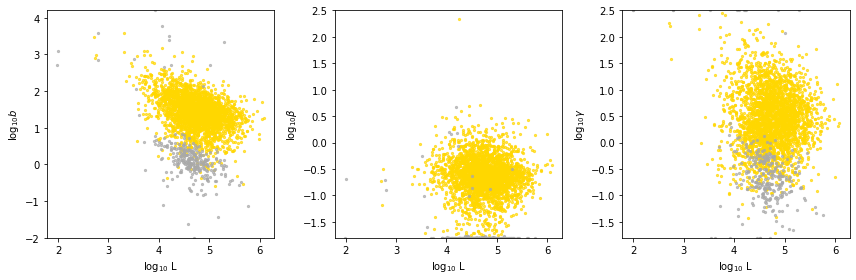

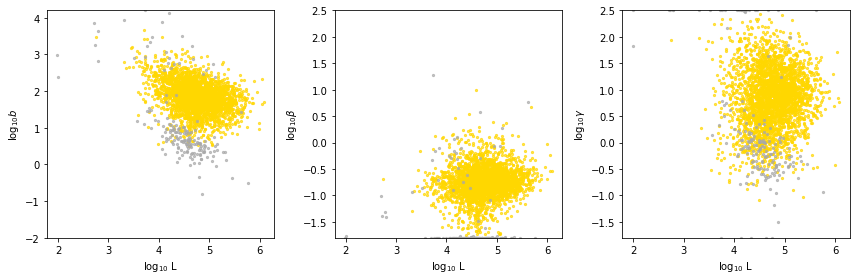

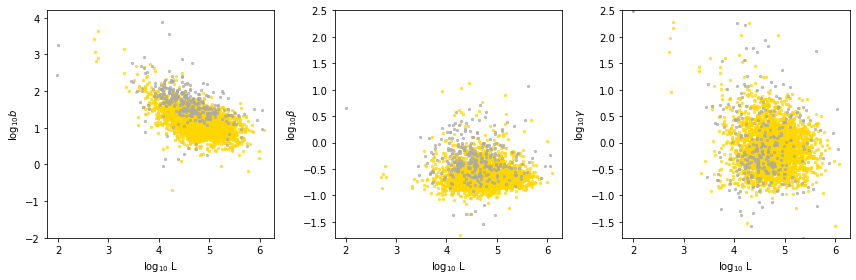

In [15]:
#See parameter fits per dataset
opt=[]
n_cells = []
for sr in sr_arr:
    y = sr.samp_optimum
    print(y)
    opt.append(y)
    n_cells.append(sr.n_cells)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
opt = np.asarray(opt)
n_cells = np.asarray(n_cells)

INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/raw.sd.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/raw.sd.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_MAPK1_NegCtr

/home/ggorin/projects/monod/src/monod/inference.py:1384: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(nrows=1, ncols=Nsamp, figsize=figsize)


INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/raw.sd.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/raw.sd.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure store

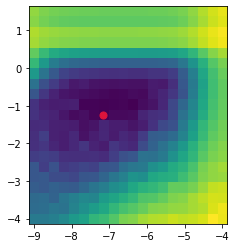

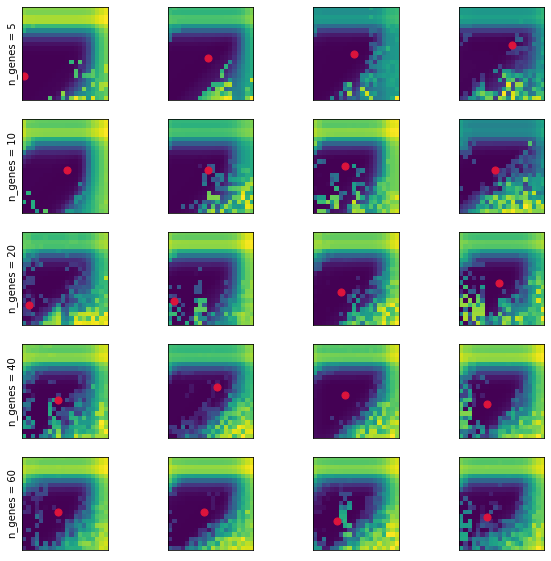

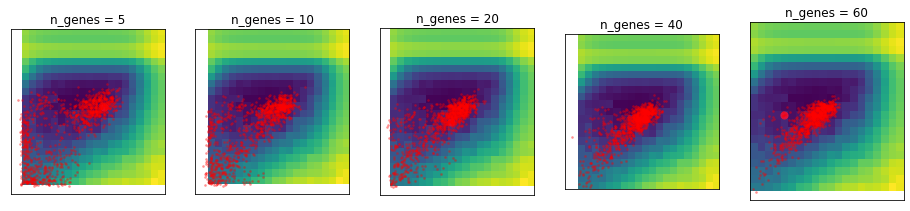

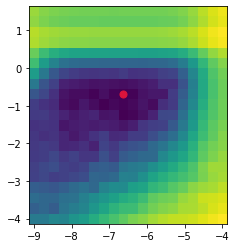

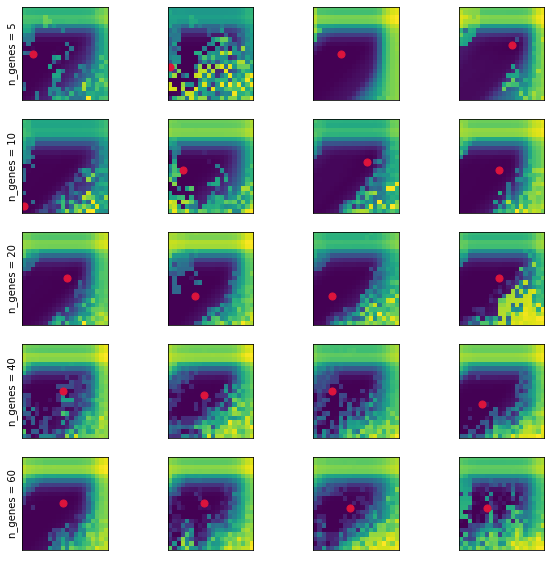

...

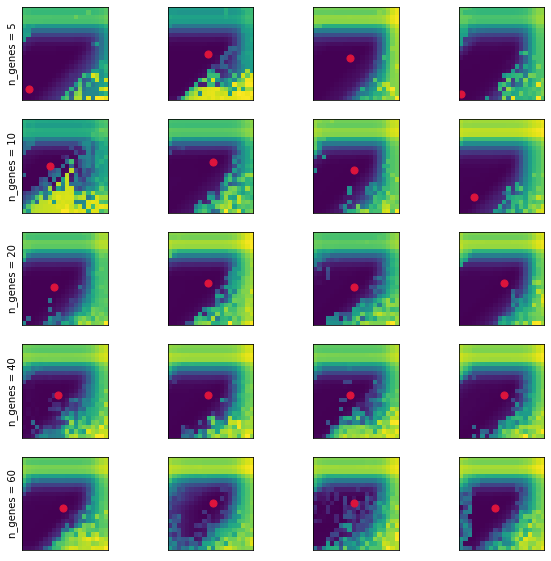

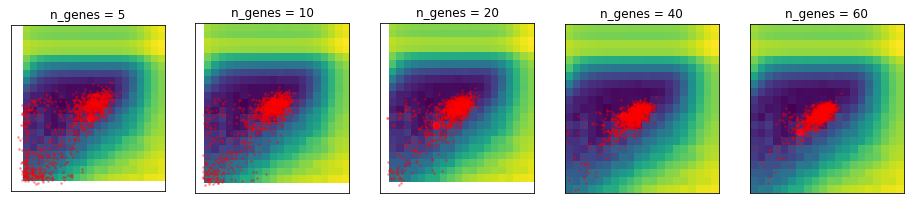

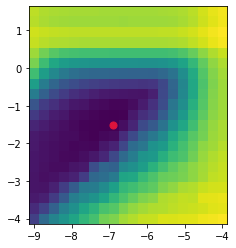

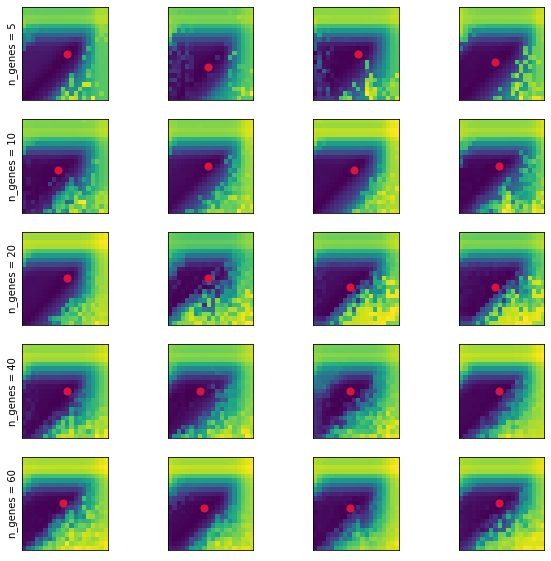

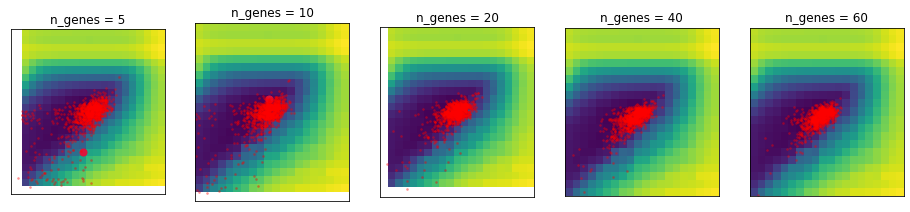

In [26]:
for i in range(len(dataset_names)):
    sr = sr_arr[i]
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.plot_landscape(ax1)
    
    sr.resample_opt_viz()
    sr.resample_opt_mc_viz()
    #sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

Plot spread of sampling parameters across datasets and pairwise comparisons

In [17]:
xl = np.asarray([sr.sp.samp_lb[0],sr.sp.samp_ub[0]])
yl = np.asarray([sr.sp.samp_lb[1],sr.sp.samp_ub[1]])
x=np.linspace(xl[0],xl[1],sr.sp.gridsize[0])
y=np.linspace(yl[0],yl[1],sr.sp.gridsize[1])

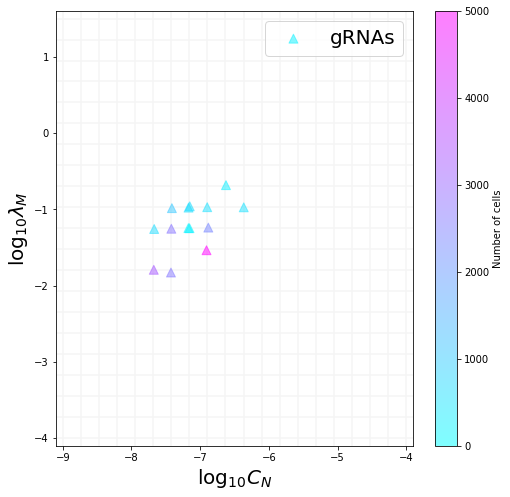

In [18]:
fs = 20
d=0.1

fig1,ax1 = plt.subplots(1,1,figsize=(8,8))
for i in range(sr.sp.gridsize[0]):
    plt.plot([x[i]]*2,yl + [-d,d],c='whitesmoke')
for i in range(sr.sp.gridsize[1]):
    plt.plot(xl+ [-d,d],[y[i]]*2,c='whitesmoke')
jit = np.random.randn(n_datasets,2)*0.01
opt_ = opt+jit
cmap = 'cool'

# ctf = range(6,n_datasets)
# plt.scatter(opt_[ctf,0],opt_[ctf,1],100,n_cells[ctf],zorder=1000,
#             alpha=0.3,cmap=cmap,label='Cell types',vmin=0,vmax=5000)

stf = range(n_datasets) #-1 to exclude combo control

plt.scatter(opt_[stf,0],opt_[stf,1],80,n_cells[stf],marker='^',zorder=1000,
            alpha=0.5,cmap=cmap,label='gRNAs',vmin=0,vmax=5000)
plt.xlim(xl+ [-d,d])
plt.ylim(yl+ [-d,d])

plt.legend(fontsize=fs,loc='upper right')
plt.colorbar(label='Number of cells')

plt.xlabel(r'$\log_{10} C_N$',fontsize=fs)
plt.ylabel(r'$\log_{10} \lambda_M$',fontsize=fs)

fig_string = sr.batch_analysis_string+'/landscape_qc.png'
plt.savefig(fig_string,dpi=450)

**Set sampling parameters**

In [405]:
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    sr.set_sampling_optimum(sr.sp.sampl_vals.index((-6.894736842105264, -1.525)))   #((-6.894736842105264, -1.525)))
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    _=sr.chisquare_testing(sd,reject_at_bounds=True,EPS=1e-20)
    #sr.rejection_index = sr.sp.sampl_vals.index((-6.894736842105264, -1.525))

INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1/raw.sd.
INFO:root:Chi-square computation complete. Rejected 245 genes out of 3000. Runtime: 2.9 seconds.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1/raw.sd.
INFO:root:Chi-square computation complete. Rejected 243 genes out of 3000. Runtime: 2.4 seconds.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1/raw.sd.
INFO:root:Chi-square computation complete. Rejected 90 genes out of 3000. Runtime: 1.9 seconds.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0/raw.sd.
INFO:root:Chi-square computation complete. Rejected 141 genes out of 3000. Runtime: 2.0 seconds.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_al

In [406]:
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    print(str(i)+': '+str(sr.samp_optimum))

0: (-6.894736842105264, -1.525)
1: (-6.894736842105264, -1.525)
2: (-6.894736842105264, -1.525)
3: (-6.894736842105264, -1.525)
4: (-6.894736842105264, -1.525)
5: (-6.894736842105264, -1.525)
6: (-6.894736842105264, -1.525)
7: (-6.894736842105264, -1.525)
8: (-6.894736842105264, -1.525)
9: (-6.894736842105264, -1.525)
10: (-6.894736842105264, -1.525)
11: (-6.894736842105264, -1.525)
12: (-6.894736842105264, -1.525)
13: (-6.894736842105264, -1.525)


In [407]:
#See paired results
control = 13

n_genes = sr_arr[0].n_genes
n_phys_pars = sr_arr[0].sp.n_phys_pars
par_vals_uncorrected = np.zeros((2,n_datasets,n_genes,n_phys_pars))


for j in range(n_datasets):
    par_vals_uncorrected[0,j,:,:] = sr_arr[control].phys_optimum
    par_vals_uncorrected[1,j,:,:] = sr_arr[j].phys_optimum


In [408]:
# sr_arr[0].rejection_index

INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221010_024_norman_crispr_1/analysis_figures

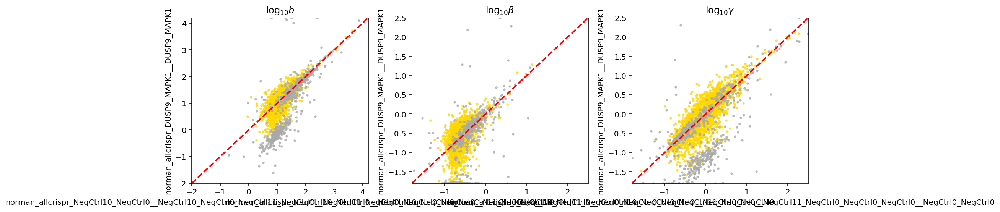

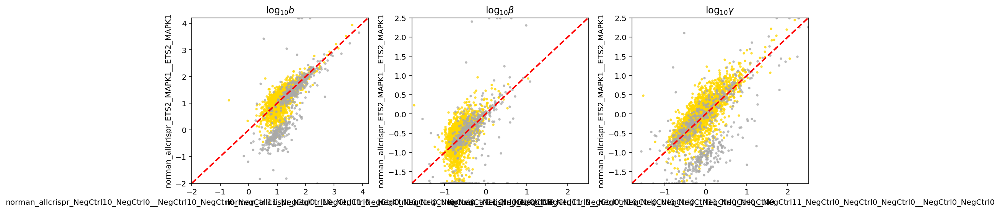

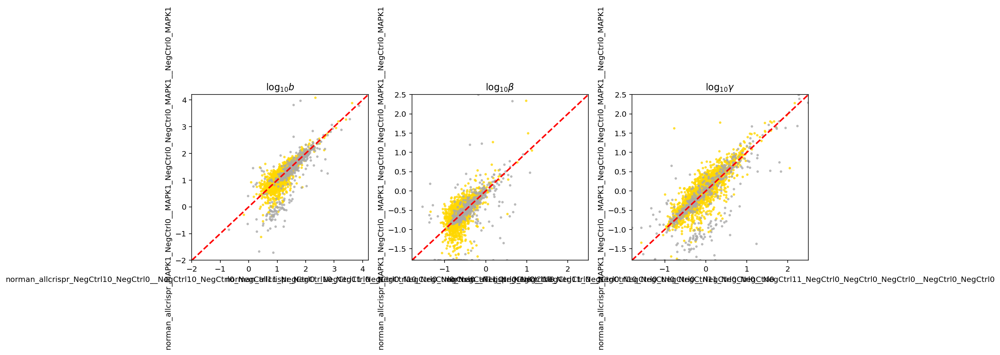

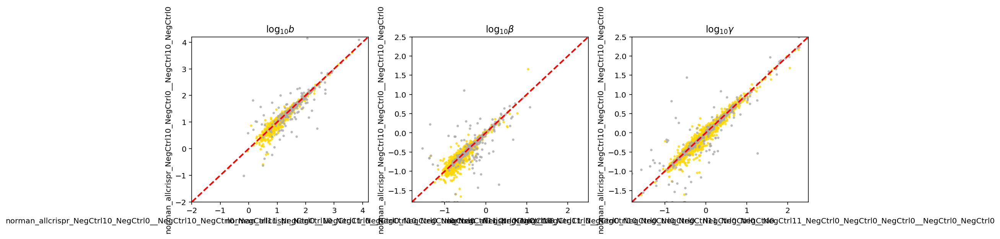

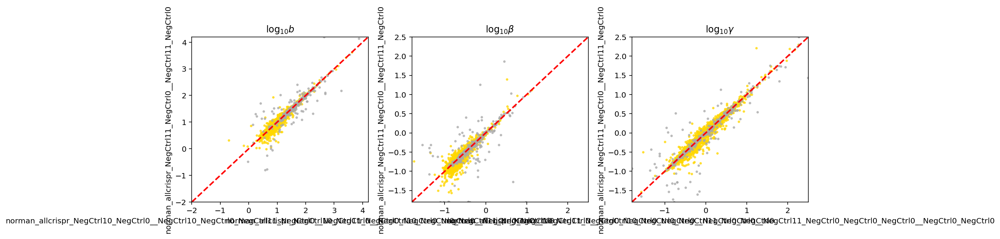

...

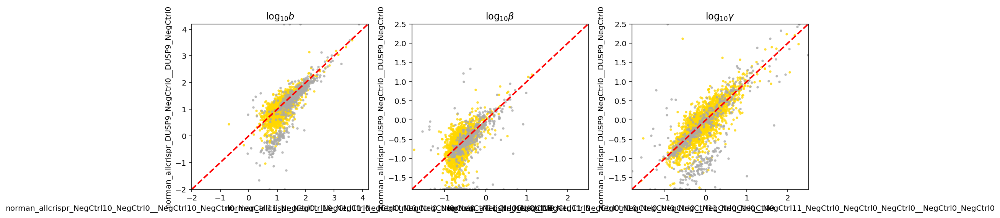

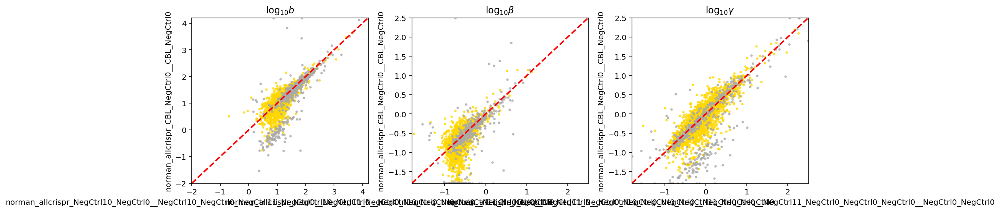

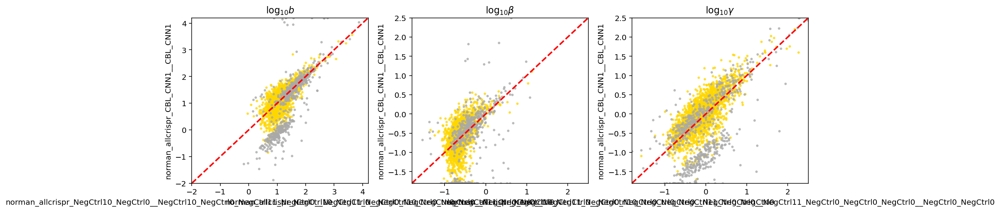

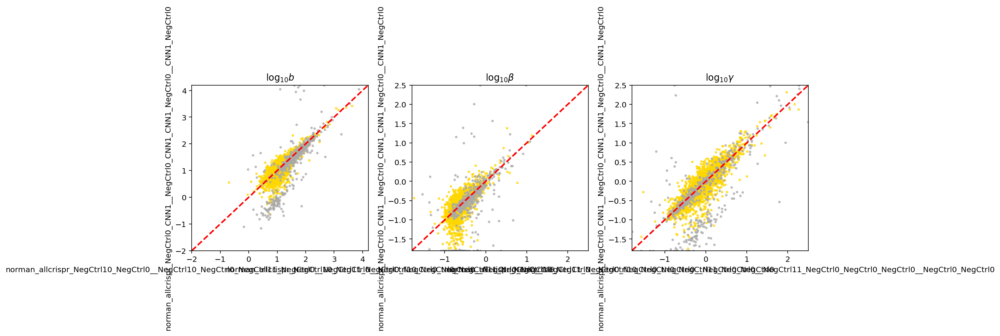

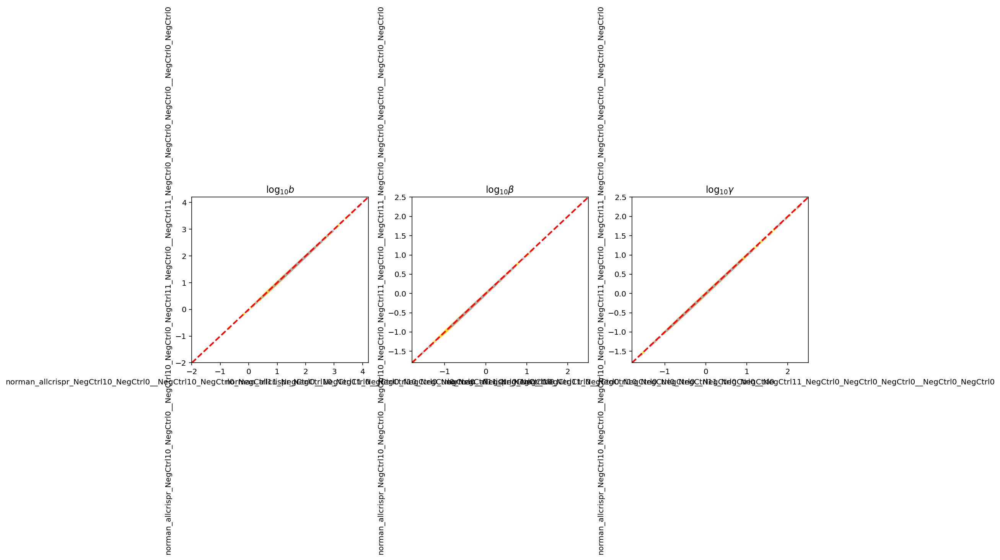

In [409]:

for j in range(n_datasets):
    monod.analysis.plot_params_for_pair(sr_arr[control],sr_arr[j],\
                         distinguish_rej=True,plot_errorbars=False,xlabel = dataset_names[control],\
                         ylabel = dataset_names[j])

INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures/pair_parameter_comparison_12.png.
INFO:root:Figure stored to ./fits/gg_221005_024_norman_crispr_0/analysis_figures

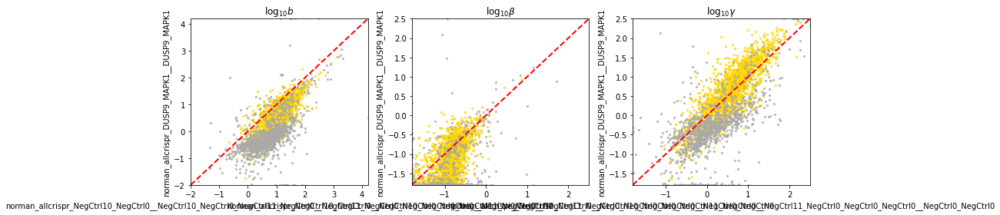

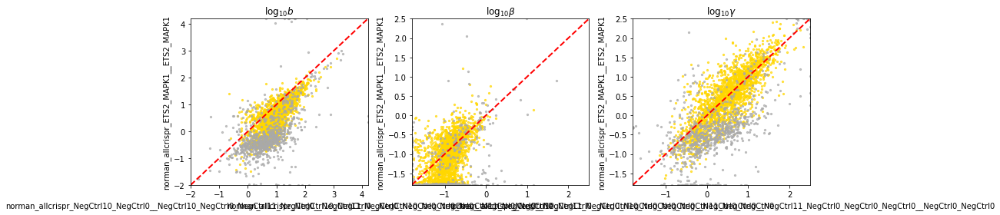

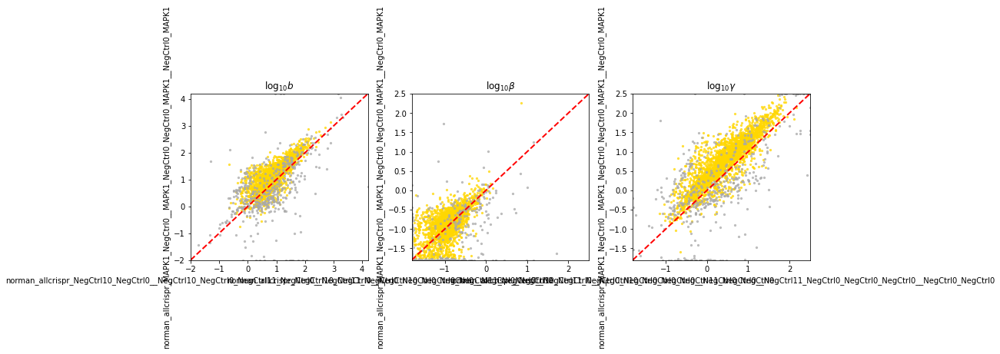

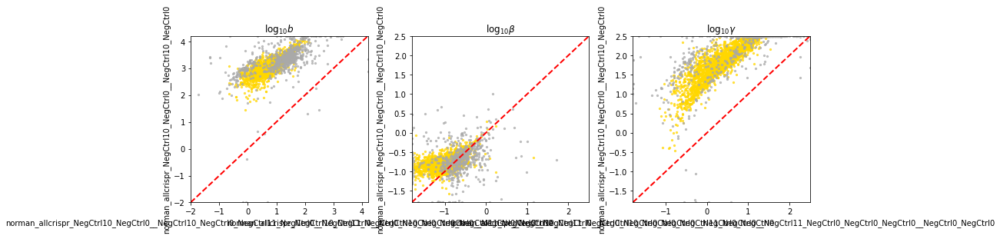

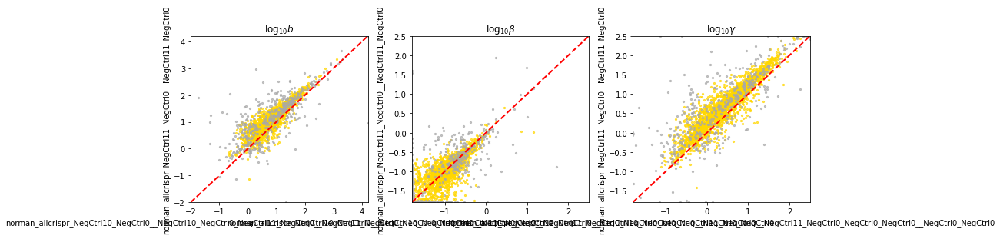

...

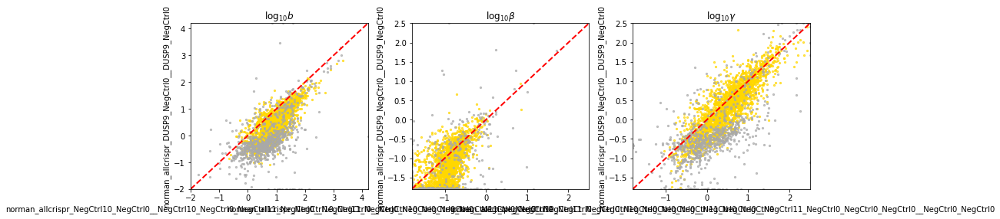

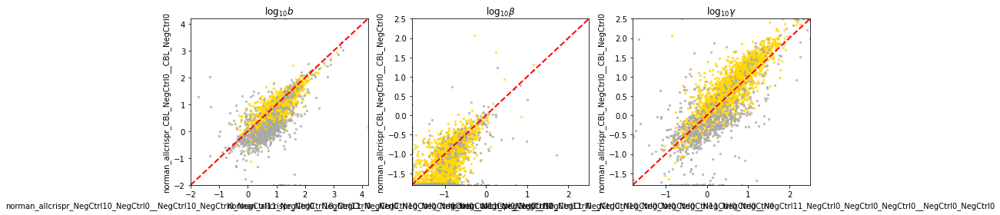

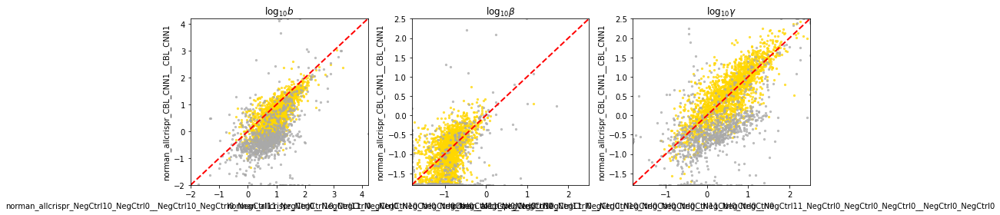

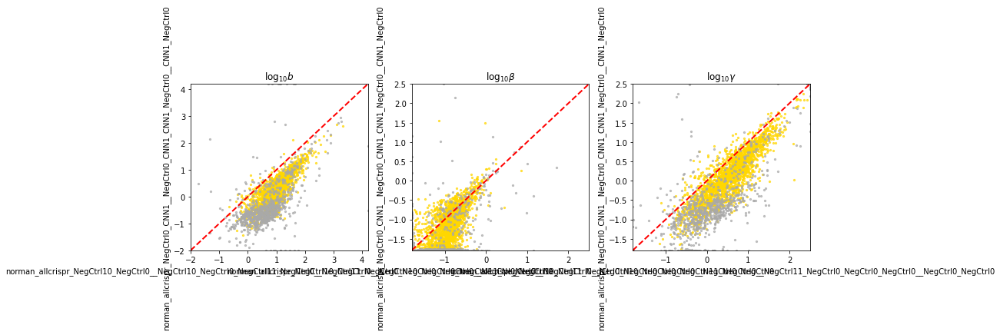

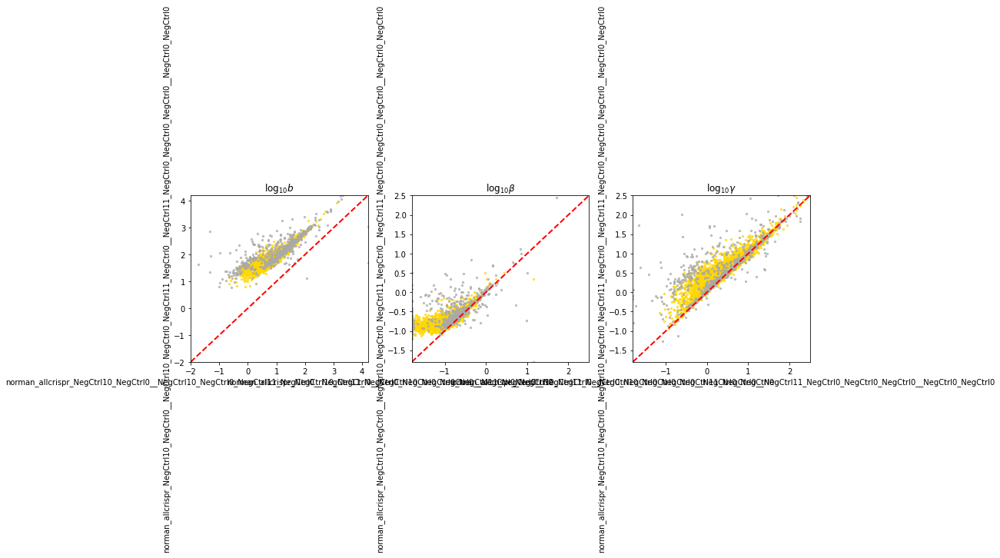

In [61]:
# #OLD
# for j in range(n_datasets):
#     monod.analysis.plot_params_for_pair(sr_arr[6],sr_arr[j],\
#                          distinguish_rej=True,plot_errorbars=False,xlabel = dataset_names[13],\
#                          ylabel = dataset_names[j])

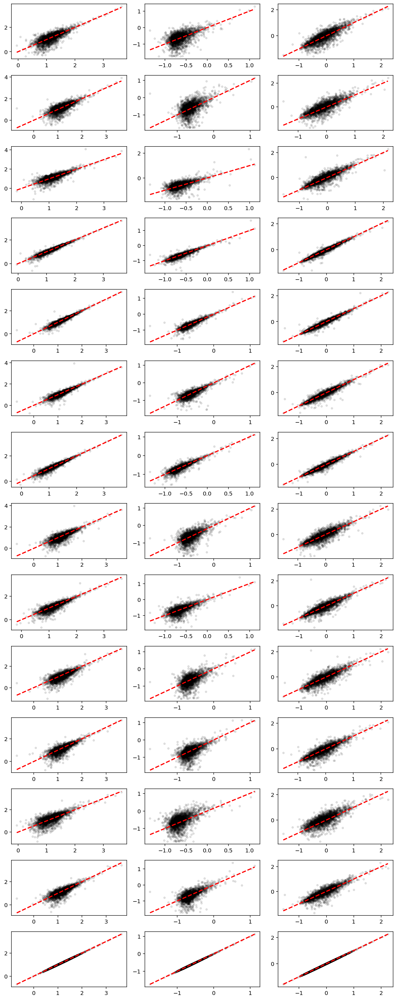

In [410]:
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(10,25))
for d in range(n_datasets):
    #Don't plot rejected genes
    base = sr_arr[control]
    comp = sr_arr[d]
        
    remain1 = np.array(base.gene_names)[~base.rejected_genes]
    remain2 = np.array(comp.gene_names)[~comp.rejected_genes]
    remain = list(set(remain1).intersection(remain2))
    
    filt1 = [list(base.gene_names).index(i) for i in remain]
    filt2 = [list(comp.gene_names).index(i) for i in remain]

    for k in range(n_phys_pars):
        
        x=par_vals_uncorrected[0,d,filt1,k]
        y=par_vals_uncorrected[1,d,filt2,k]
        xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

        ax1[d,k].plot(xl,xl,'r--',linewidth=2)
fig1.tight_layout()

In [53]:
# offsets = []
# param_names = sr_arr[0].model.get_log_name_str()
# par_vals = np.copy(par_vals_uncorrected)
# for k in range(n_phys_pars):
#     m1 = par_vals_uncorrected[0,control,:,k]
# #     for j in range(1,n_datasets):
# #         m2 = par_vals_uncorrected[0,j,:,k]
# #         offset = monod.analysis.diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
# #         par_vals[0,j,:,k] -= offset
#     for j in range(n_datasets):
#         m2 = par_vals_uncorrected[1,j,:,k]
#         offset = monod.analysis.diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
#         par_vals[1,j,:,k] -= offset

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/home/ggorin/projects/monod/src/monod/analysis.py:724: RuntimeWarning: invalid value encountered in true_divide
  z = (resid - fitparams[0]) / fitparams[1]


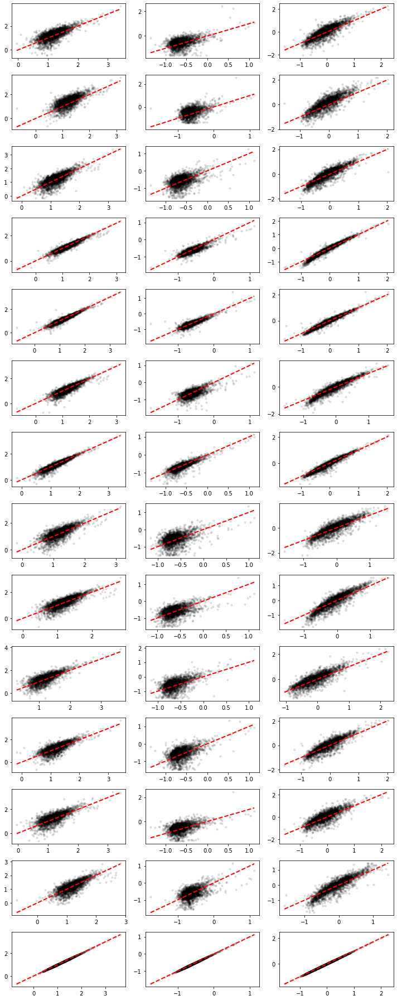

In [54]:
# fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(10,25))
# for d in range(n_datasets):
#     #Don't plot rejected genes
#     base = sr_arr[control]
#     comp = sr_arr[d]
        
#     remain1 = np.array(base.gene_names)[~base.rejected_genes]
#     remain2 = np.array(comp.gene_names)[~comp.rejected_genes]
#     remain = list(set(remain1).intersection(remain2))
    
#     filt1 = [list(base.gene_names).index(i) for i in remain]
#     filt2 = [list(comp.gene_names).index(i) for i in remain]
    
#     for k in range(n_phys_pars):
#         x=par_vals[0,d,filt1,k]
#         y=par_vals[1,d,filt2,k]
#         xl = [min(x),max(x)]
#         ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

#         ax1[d,k].plot(xl,xl,'r--',linewidth=2)
# fig1.tight_layout()

## **Genes of Interest from Study** 
DE Genes identified from Norman et al. 2019 between perturbed cells

In [411]:
# a e s t h e t i c s

#all
col_gold = [203/255,197/255,149/255]
col_gray = [116/255,112/255,113/255]
col_red = [212/255,107/255,75/255]

### SI figures
ms = 0.7
lw = ms
ms_fail = 1
alf = 0.3
alf_fail = 0.5
sifig_aesth = (ms,lw,ms_fail,alf,alf_fail)

### Body figures
ms = 2
lw = ms
ms_fail = 2
alf = 0.3
alf_fail = 0.8
msfig_aesth = (ms,lw,ms_fail,alf,alf_fail)

markerstyle = None

In [590]:
#For DUSP9/ETS2

names = ["AIF1", "TMSB4X", "SH3BGRL3", "GPSM3", "AP1S2", "PFN1", "IFITM2", "GMFG", "S100A11", "LIMD2",
         "ID1", "TMSB10", "CD47", "MSN", "TPM4", "ISG15", "ACTB", "UBE2L6", "PPP1R18", "RAC2", "ABRACL",
         "VASP", "PDLIM1", "EVA1B", "MT1X", "LAPTM5", "VAMP8", "MT1G", "VIM", "CTSH", "MATK", "SMAGP",
         "SUB1", "BCL7C", "APOC1", "CTSL", "AC079466.1", "RP11-301G19.1", "ACTG1",
         "LY6E", "TPT1", "TEX30", "BID", "PTPN7", "CLIC1", "RPL10", "RPL5", "RPS3", "PRSS57", "RPL7",
         "HMGA1", "RPS6", "RPL35A", "RPL23", "HBZ", "BSG", "GYPB", "ALAS2", "COL18A1", "ATP5E", "GUK1",
         "BTG1", "GMPPA", "ACP5", "GYPE", "CD7", "GYPC", "SQLE", "FTH1", "GYPA", "HBG2", "PPP1R14A", "SLC25A37",
         "BLVRB", "ST6GALNAC1", "HBG1", "HBA1", "LAMTOR5", "COX17", "TESC", "FAM83A", "CSTB", "MAP1B", 
         "TCF4", "NDUFAF2", "ASRGL1", "ZC3HAV1", "PLA2G12A", "MAP1A", "NENF", "NME4", "GSTP1", "HDDC2", "CFD", 
         "TPD52L1", "APOE", "PRKAR2B", "HBQ1", "ATP5I", "UBAC1"]

# # #For CNN1/CBL
# names = ["HBA2", "ALAS2", "HBA1", "SLC25A37", "HBZ", "TMSB4X", "PRSS57", "PRELID1", "MIF", "RANBP1", "TEX30",
#          "PKM", "SMIM1", "GYPB", "TESC", "COL18A1", "CHI3L2", "APOE", "APOC1", "HBG2", "HBG1", 
#          "BLVRB", "CD99", "XG", "ZFP36L1", "REEP6", "EEF1A1", "GSTP1","GYPA", "NARF"]

print(len(names))

100


In [591]:
par_vals = par_vals_uncorrected

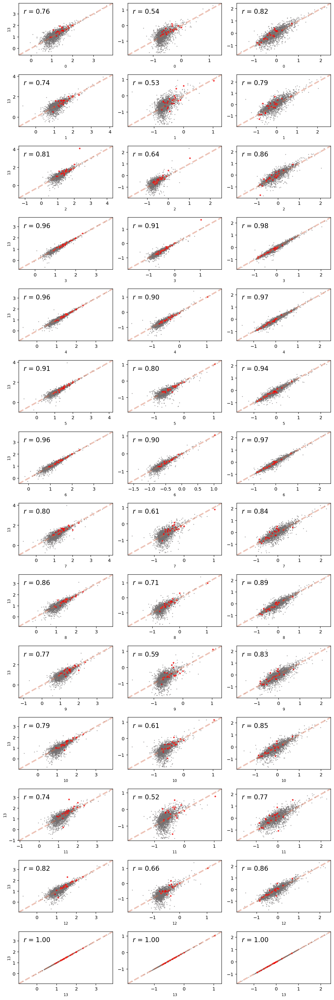

In [592]:
ms,lw,ms_fail,alf,alf_fail = sifig_aesth
c_highlight = col_red
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(10,30))
for d in range(n_datasets):
    #Don't plot rejected genes
    base = sr_arr[control]
    comp = sr_arr[d]
    
    err1 = base.sigma*1.645#2.576
    err2 = comp.sigma*1.645#2.576
        
    remain1 = np.array(base.gene_names)[~base.rejected_genes]
    remain2 = np.array(comp.gene_names)[~comp.rejected_genes]
    remain = list(set(remain1).intersection(remain2))
    
    filt1 = [list(base.gene_names).index(i) for i in remain]
    filt2 = [list(comp.gene_names).index(i) for i in remain]
    
    for k in range(n_phys_pars):
        x=par_vals[0,d,filt1,k]
        y=par_vals[1,d,filt2,k]
        #xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,color=col_gray,alpha=alf_fail,s=ms_fail) 
        
#         ax1[d,k].errorbar(x,y,err1[filt1,k],err2[filt2,k],
#                           marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)
        
        
        #Get max limits
        maxY = max(ax1[d,k].get_ylim())
        maxX = max(ax1[d,k].get_xlim())
        
        minY = min(ax1[d,k].get_ylim())
        minX = min(ax1[d,k].get_xlim())
        
        plotMax = max([maxY,maxX])
        plotMin = min([minY,minX])
        
        ax1[d,k].set_xlim([plotMin,plotMax])
        ax1[d,k].set_ylim([plotMin,plotMax])
        
        xl = ax1[d,k].get_xlim()
        ax1[d,k].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        
        
        #Plot literature genes
        fs=14
        sml=8
        rho=np.corrcoef(x,y)[0][1]
        xl = ax1[d,k].get_xlim()
        ax1[d,k].set_xlabel(str(d),fontsize=sml)

        if k==0:
            ax1[d,k].set_ylabel(str(control),fontsize=sml)
        ax1[d,k].text(.05,.8,r'$r$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[d,k].transAxes)
        
        ax1[d,k].scatter(x[pd.Categorical(remain).isin(names)],
                         y[pd.Categorical(remain).isin(names)],
                         color='red',alpha=0.6,s=7)
        
        
fig1.tight_layout()
fig1.savefig('allSampCorrs.pdf')

In [593]:
for i in range(len(dataset_names)):
    print(str(i)+': '+dataset_names[i])
  

0: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
1: norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1
2: norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1
3: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0
4: norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0
5: norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0
6: norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0
7: norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2
8: norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0
9: norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0
10: norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0
11: norman_allcrispr_CBL_CNN1__CBL_CNN1
12: norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0
13: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0


In [416]:
s.sp.phys_lb.shape

(3,)

In [417]:
#### Maybe want to add check_at_bounds() to remove parameters at bounds?
def check_at_bounds(arr,phys_params,thr=0.01):
    #Check for genes where parameter fits are close to boundary of grid
    x = np.any(np.logical_or(
        arr.sp.phys_lb+thr > phys_params,
        arr.sp.phys_ub-thr < phys_params) ,1)
    return x

## **Test log-additive/multiplicative prediction model**

z-CTRL = a-CTRL + b-CTRL where z=log(param_ab), a=log(param_a),b=log(param_b), CTRL=log(param_CTRL)

Assuming fold changes have cumulative effect

**Set parameters and gene filters for model**

In [834]:
control=13

In [835]:
# s = sr_arr[0]
# check_at_bounds(s,par_vals[1,0,:,:])

In [836]:
for i in range(len(dataset_names)):
    print(str(i)+': '+dataset_names[i])
  

0: norman_allcrispr_DUSP9_MAPK1__DUSP9_MAPK1
1: norman_allcrispr_ETS2_MAPK1__ETS2_MAPK1
2: norman_allcrispr_MAPK1_NegCtrl0__MAPK1_NegCtrl0_NegCtrl0_MAPK1__NegCtrl0_MAPK1
3: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0
4: norman_allcrispr_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0
5: norman_allcrispr_NegCtrl1_NegCtrl0__NegCtrl1_NegCtrl0
6: norman_allcrispr_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0
7: norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2
8: norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0
9: norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0
10: norman_allcrispr_CBL_NegCtrl0__CBL_NegCtrl0
11: norman_allcrispr_CBL_CNN1__CBL_CNN1
12: norman_allcrispr_NegCtrl0_CNN1__NegCtrl0_CNN1_CNN1_NegCtrl0__CNN1_NegCtrl0
13: norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0


In [837]:
inds = [9,8,7,control]

cond1_res = sr_arr[inds[0]]  #9,8,7 DUSP9-ETS2 (or 10,12,11 CBL-CNN1, 9,2,0 DUSP9-MAPK1, 8,2,1 ETS2-MAPK1)
cond2_res = sr_arr[inds[1]]
both_res = sr_arr[inds[2]]
ctrl_res = sr_arr[inds[3]]  


#Filtered for genes shared by all samples
forFilt = [cond1_res,cond2_res,both_res,ctrl_res]


remain1 = forFilt[0].gene_names[~forFilt[0].rejected_genes] #~forFilt[0].gene_rej &
remainAll = remain1
#remain1 = remain1[pd.Categorical(remain1).isin(names)]

filts = []

for i in range(1,len(forFilt[1:])):

    f = forFilt[i]
    remain2 = f.gene_names[~f.rejected_genes] #~i.gene_rej & 
    #remain2 = remain2[pd.Categorical(remain2).isin(names)]

    remainAll = list(set(remainAll).intersection(remain2))

    
for i in range(len(forFilt)):
    filts += [[list(forFilt[i].gene_names).index(x) for x in remainAll]]

#Get only DE genes from study
remainAllSub = np.array(remainAll)[pd.Categorical(remainAll).isin(names)]


filtsSub = []
for i in range(len(forFilt)):
    filtsSub += [[list(forFilt[i].gene_names).index(x) for x in remainAllSub]]

    
        

In [838]:
len(remainAll)

2685

**Perturbation Model**

In [839]:
#Fit model for all params and plot FC correlations to fit data

#MODEL
z = (par_vals[1,inds[0],filts[0],:] - par_vals[1,inds[-1],filts[-1],:]) + (par_vals[1,inds[1],filts[1],:] - par_vals[1,inds[-1],filts[-1],:])

#Get previously fit parameter vaues,'ground truth'
true = (par_vals[1,inds[2],filts[2],:] - par_vals[1,inds[-1],filts[-1],:])



In [840]:
#Fit model just for DE Genes

#MODEL, 10** for additive
z_sub = (par_vals[1,inds[0],filtsSub[0],:] - par_vals[1,inds[-1],filtsSub[-1],:]) + (par_vals[1,inds[1],filtsSub[1],:] - par_vals[1,inds[-1],filtsSub[-1],:])

#Get previously fit parameter vaues,'ground truth'
true_sub = (par_vals[1,inds[2],filtsSub[2],:] - par_vals[1,inds[-1],filtsSub[-1],:])



**Negative Control Model**

In [841]:
inds_neg = [3,4,7,control]

cond1_res_neg = sr_arr[inds_neg[0]]  #9,8,7 DUSP9-ETS2 (or 10,12,11 CBL-CNN1, 9,2,0 DUSP9-MAPK1, 8,2,1 ETS2-MAPK1)
cond2_res_neg = sr_arr[inds_neg[1]]
both_res_neg = sr_arr[inds_neg[2]]
ctrl_res_neg = sr_arr[inds_neg[3]]  


#Filtered for genes shared by all samples
forFilt_neg = [cond1_res_neg,cond2_res_neg,both_res_neg,ctrl_res_neg]


remain1_neg = forFilt_neg[0].gene_names[~forFilt_neg[0].rejected_genes] #~forFilt[0].gene_rej &
remainAll_neg = remain1_neg
#remain1 = remain1[pd.Categorical(remain1).isin(names)]

filts_neg = []

for i in range(1,len(forFilt_neg[1:])):

    f_neg = forFilt_neg[i]
    remain2_neg = f_neg.gene_names[~f_neg.rejected_genes] #~i.gene_rej & 
    #remain2 = remain2[pd.Categorical(remain2).isin(names)]

    remainAll_neg = list(set(remainAll_neg).intersection(remain2_neg))

for i in range(len(forFilt_neg)):
    filts_neg += [[list(forFilt_neg[i].gene_names).index(x) for x in remainAll_neg]]

    
    
    
    
#Get only DE genes from study
remainAllSub_neg = np.array(remainAll_neg)[pd.Categorical(remainAll_neg).isin(names)]


filtsSub_neg = []
for i in range(len(forFilt_neg)):
    filtsSub_neg += [[list(forFilt_neg[i].gene_names).index(x) for x in remainAllSub_neg]]

    
        

In [842]:
len(remainAll_neg)

2706

In [843]:
#Fit model for all params and plot FC correlations to fit data

#MODEL
z_neg = (par_vals[1,inds_neg[0],filts_neg[0],:] - par_vals[1,inds_neg[-1],filts_neg[-1],:]) + (par_vals[1,inds_neg[1],filts_neg[1],:] - par_vals[1,inds_neg[-1],filts_neg[-1],:])

#Get previously fit parameter vaues,'ground truth'
true_neg = (par_vals[1,inds_neg[2],filts_neg[2],:] - par_vals[1,inds_neg[-1],filts_neg[-1],:])



In [844]:
#Fit model just for DE Genes

#MODEL
z_sub_neg = (par_vals[1,inds_neg[0],filtsSub_neg[0],:] - par_vals[1,inds_neg[-1],filtsSub_neg[-1],:]) + (par_vals[1,inds_neg[1],filtsSub_neg[1],:] - par_vals[1,inds_neg[-1],filtsSub_neg[-1],:])

#Get previously fit parameter vaues,'ground truth'
true_sub_neg = (par_vals[1,inds_neg[2],filtsSub_neg[2],:] - par_vals[1,inds_neg[-1],filtsSub_neg[-1],:])



## **Inspect Prediction Results**

In [845]:
#Check corrs for model
for i in range(3):
    print(np.corrcoef(z[:,i],true[:,i])[0][1])

0.23236072888286297
0.2515994910577149
0.2619687477888311


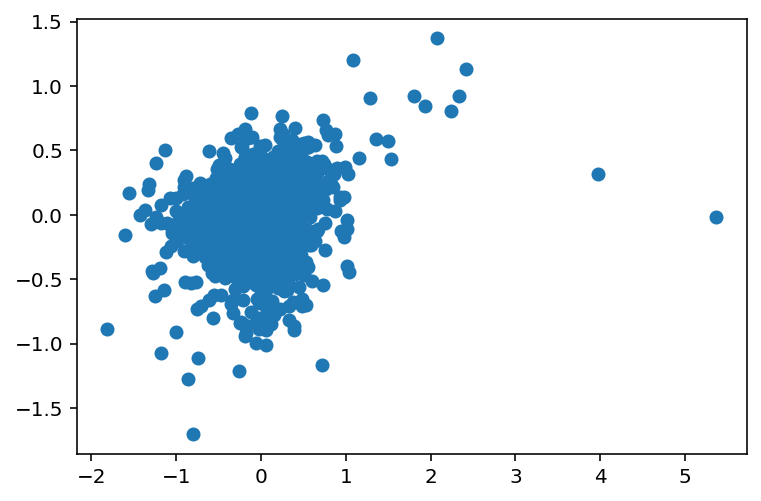

In [846]:
plt.scatter(z[:,i],true[:,i])

In [847]:
np.corrcoef(z[z[:,i]<3,i],true[z[:,i]<3,i])

array([[1.        , 0.27516211],
       [0.27516211, 1.        ]])

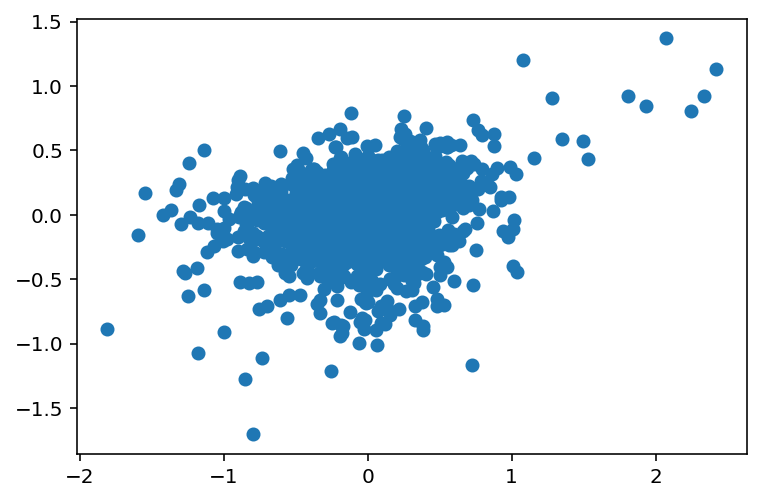

In [848]:
plt.scatter(z[z[:,i]<3,i],true[z[:,i]<3,i])

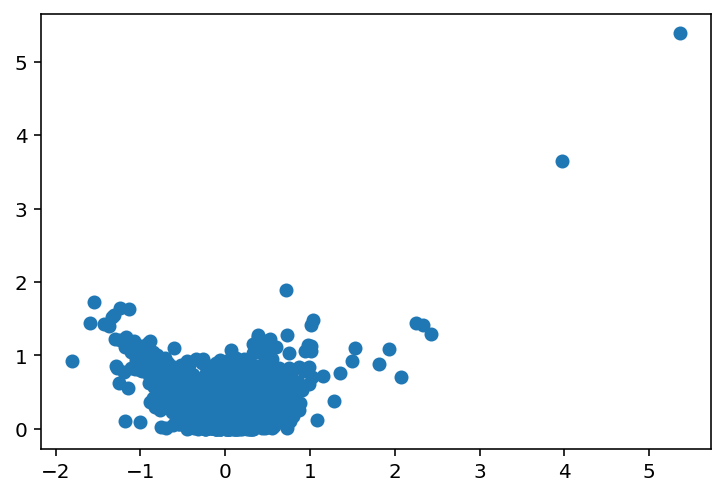

In [609]:
plt.scatter(z[:,i],np.abs(z[:,i]-true[:,i]))

In [574]:
# sr_arr[inds[0]].sp.


In [631]:
#Check corrs for negative model
for i in range(3):
    print(np.corrcoef(z_neg[:,i],true_neg[:,i])[0][1])

0.1597534794595599
0.20406660241518318
0.1811636730635128


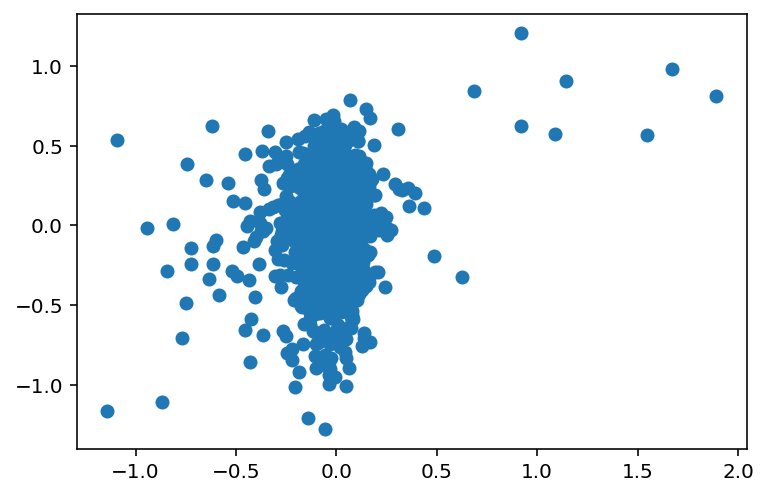

In [611]:

plt.scatter(z_neg[:,i],true_neg[:,i])

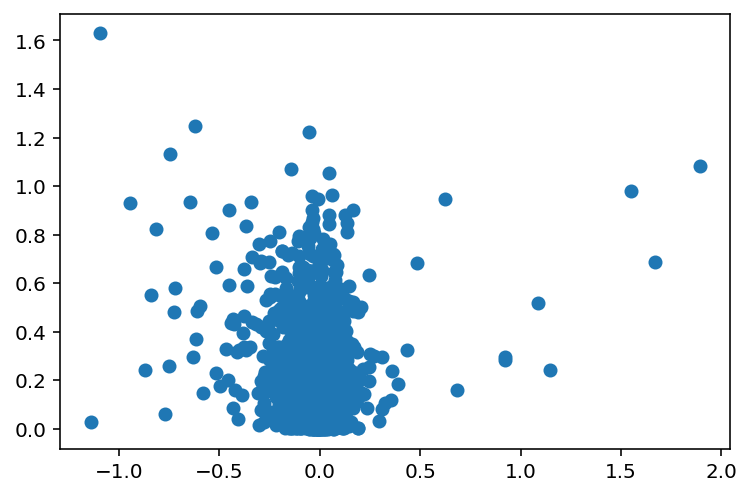

In [612]:
plt.scatter(z_neg[:,i],np.abs(z_neg[:,i]-true_neg[:,i]))

Model prediction results on DE genes from study

In [629]:
#Check corrs for model
for i in range(3):
    print(np.corrcoef(z_sub[:,i],true_sub[:,i])[0][1])

0.7692422114645476
0.6861910540879095
0.7714671807422652


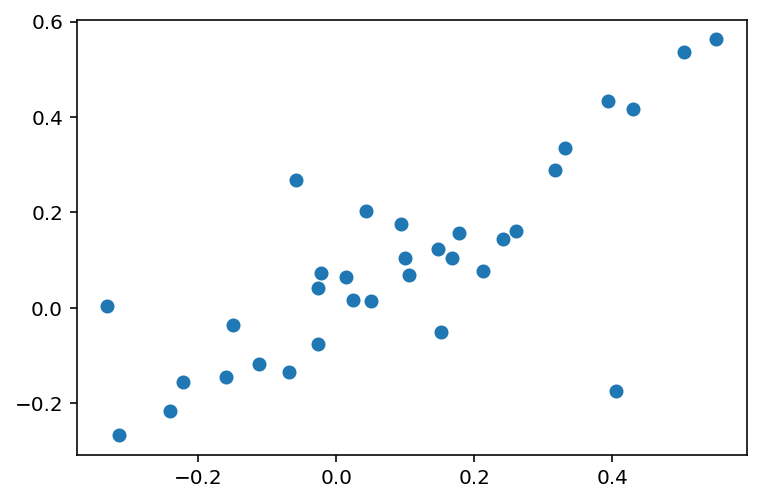

In [614]:
plt.scatter(z_sub[:,i],true_sub[:,i])

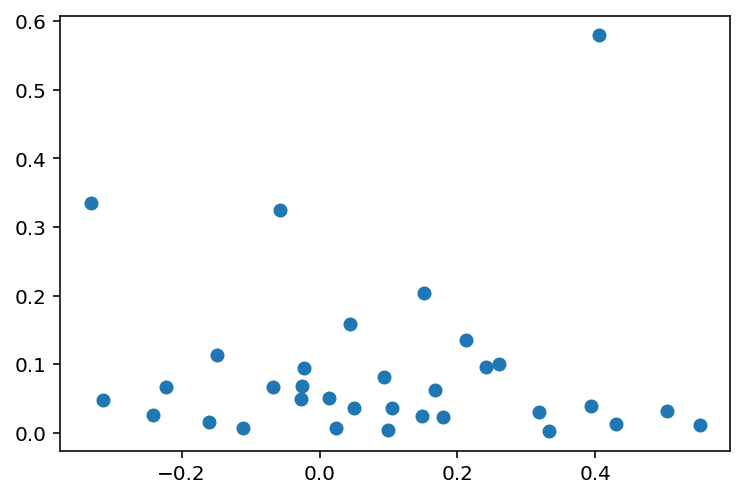

In [615]:
plt.scatter(z_sub[:,i],np.abs(z_sub[:,i]-true_sub[:,i]))

In [850]:
#Check corrs for negative model
for i in range(3):
    print(np.corrcoef(z_sub_neg[:,i],true_sub_neg[:,i])[0][1])

0.5314455774294936
-0.03984213139303559
0.30096537451738836


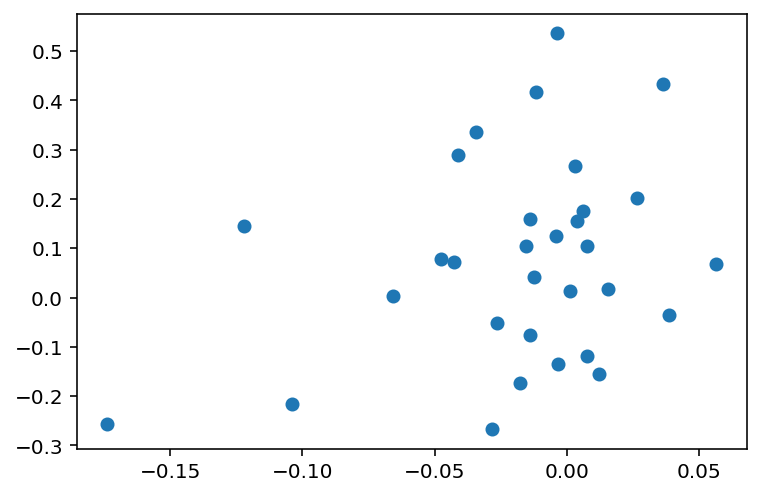

In [851]:
plt.scatter(z_sub_neg[:,i],true_sub_neg[:,i])

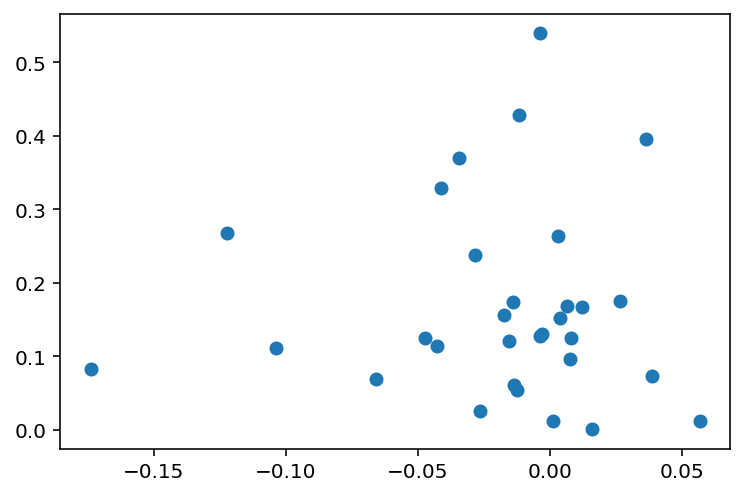

In [619]:
plt.scatter(z_sub_neg[:,i],np.abs(z_sub_neg[:,i]-true_sub_neg[:,i]))

## **Compare Model Capabilities at Expression-Level**

In [803]:
filts2=filts

In [804]:
#Use inds for now
sd_arr = []
for i in inds:
    sd_arr += [monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')]


INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_NegCtrl0__DUSP9_NegCtrl0/raw.sd.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl0_ETS2__NegCtrl0_ETS2_ETS2_NegCtrl0__ETS2_NegCtrl0/raw.sd.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_DUSP9_ETS2__DUSP9_ETS2/raw.sd.
INFO:root:Search data loaded from ./fits/gg_221010_024_norman_crispr_1/norman_allcrispr_NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0_NegCtrl11_NegCtrl0__NegCtrl11_NegCtrl0_NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0/raw.sd.


In [805]:
s_means = np.mean(sd_arr[0].layers[1,filts2[0],:],axis=1)

s_means2 = np.mean(sd_arr[1].layers[1,filts2[1],:],axis=1)

s_means_both = np.mean(sd_arr[2].layers[1,filts2[2],:],axis=1)

s_means_ctrl = np.mean(sd_arr[3].layers[1,filts2[3],:],axis=1)


#Deltas

delta_a = np.log10(s_means)-np.log10(s_means_ctrl)
delta_b = np.log10(s_means2)-np.log10(s_means_ctrl)
delta_ab = np.log10(s_means_both)-np.log10(s_means_ctrl)

In [806]:
#Corr of S1 + S2 to S1,2
print(np.corrcoef(delta_a+delta_b,delta_ab)[0][1])

0.7853581466678063


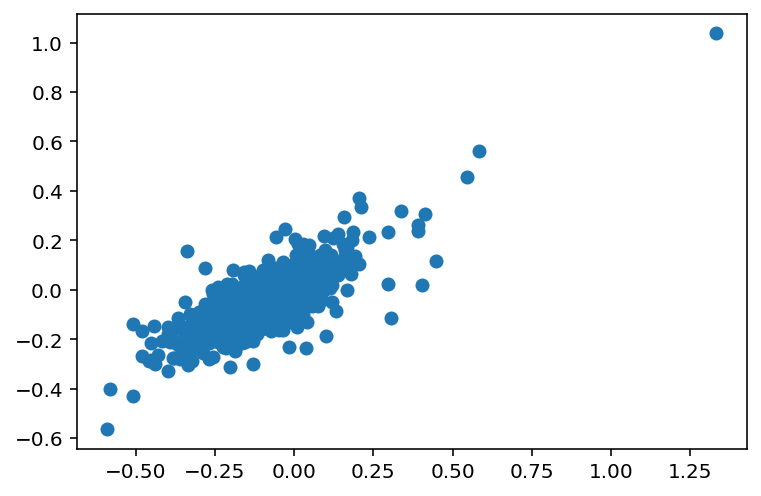

In [807]:
#Corr of S1 + S2 to S1,2
plt.scatter(delta_a+delta_b,delta_ab)

In [808]:
#Corr of b/g_1 (indices, 1,2) fc to S1 fc
print(np.corrcoef(delta_a+delta_b,delta_ab)[0][1])

0.7853581466678063


In [809]:
bg1 = par_vals[1,inds[0],filts2[0],0]-par_vals[1,inds[0],filts2[0],2]
bg2 = par_vals[1,inds[1],filts2[1],0]-par_vals[1,inds[1],filts2[1],2]
bg_both = par_vals[1,inds[2],filts2[2],0]-par_vals[1,inds[2],filts2[2],2]

bgctrl = par_vals[1,inds[3],filts2[3],0]-par_vals[1,inds[3],filts2[3],2]

In [810]:
#Corr of b/gamma to S_mean
print(np.corrcoef(10**bg1,s_means)[0][1])
print(np.corrcoef(10**bg2[(10**bg2)<10000],s_means2[(10**bg2)<10000])[0][1])
print(np.corrcoef(10**bg_both[(10**bg_both)<10000],s_means_both[(10**bg_both)<10000])[0][1])


0.9971507639094337
0.9929017208461317
0.9995967304815134


Text(0, 0.5, 'S_mean')

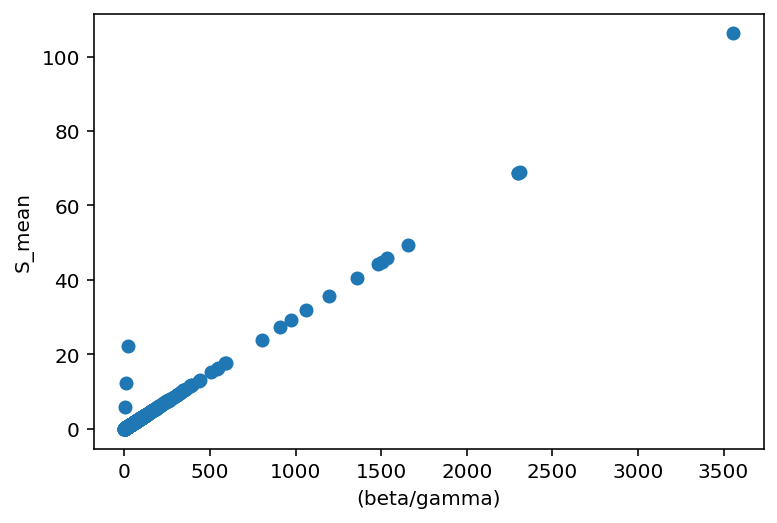

In [811]:
plt.scatter(10**bg2[(10**bg2)<10000],s_means2[(10**bg2)<10000])
plt.xlabel("(beta/gamma)")
plt.ylabel("S_mean")

Text(0, 0.5, 'S_mean')

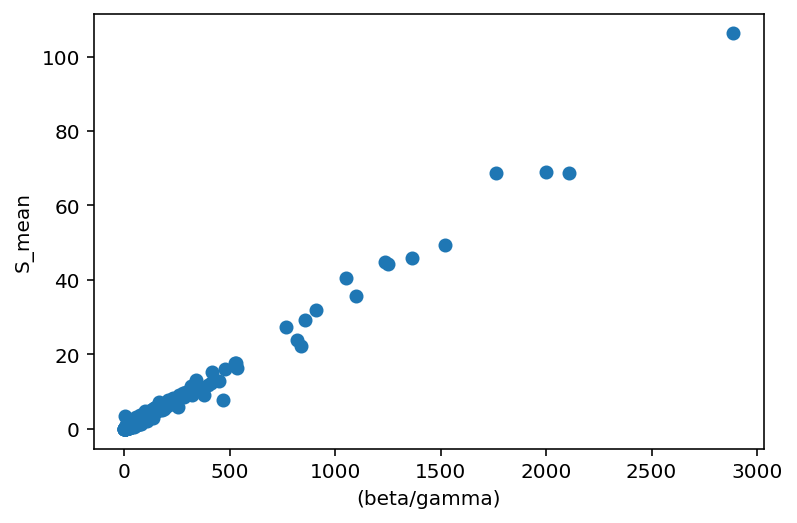

In [812]:
plt.scatter(10**bg_both[(10**bg_both)<10000],s_means2[(10**bg_both)<10000])
plt.xlabel("(beta/gamma)")
plt.ylabel("S_mean")

In [814]:
delta_a_approx = bg1-bgctrl
delta_b_approx = bg2-bgctrl
delta_ab_approx = bg_both-bgctrl

0.8843559585025681
0.7175732573546885
0.9075254711257432


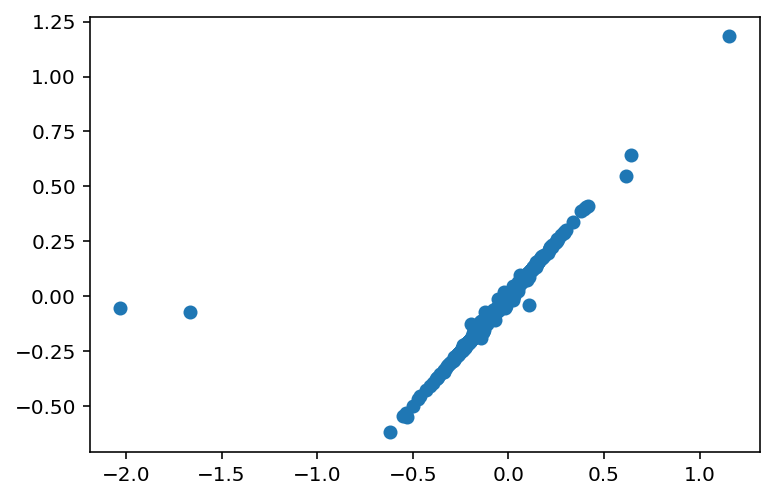

In [815]:
#CCorr of b/g_1 (indices, 1,2) fc to S1 fc
print(np.corrcoef(delta_a_approx[(10**bg1)<10000],delta_a[(10**bg1)<10000])[0][1])
print(np.corrcoef(delta_b_approx[(10**bg2)<10000],delta_b[(10**bg2)<10000])[0][1])
print(np.corrcoef(delta_ab_approx[(10**bg_both)<10000],delta_ab[(10**bg_both)<10000])[0][1])

plt.scatter(delta_a_approx,delta_a)

In [824]:
print(np.corrcoef(delta_a_approx[((10**bg1)<10000) & ((10**bg_both)<10000) & ((10**bg2)<10000)]+delta_b_approx[((10**bg1)<10000) & ((10**bg_both)<10000) & ((10**bg2)<10000)],delta_ab[((10**bg1)<10000) & ((10**bg_both)<10000) & ((10**bg2)<10000)])[0][1])



0.5632604287490156


In [853]:
pred = delta_a_approx[((10**bg1)<10000) & ((10**bg_both)<10000) & ((10**bg2)<10000)]+delta_b_approx[((10**bg1)<10000) & ((10**bg_both)<10000) & ((10**bg2)<10000)]

true2 = delta_ab[((10**bg1)<10000) & ((10**bg_both)<10000) & ((10**bg2)<10000)]




In [855]:
np.corrcoef(pred,true2)[0][1]

0.5632604287490156

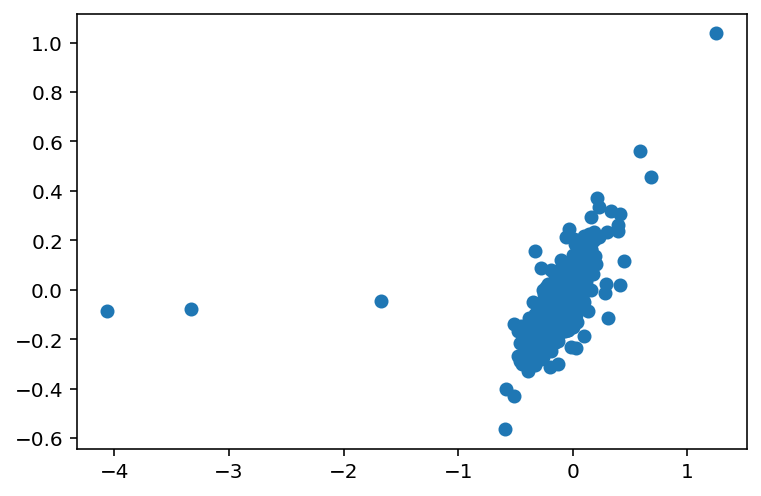

In [854]:
#Corr of S1 + S2 to S1,2
plt.scatter(pred,true2)





In [857]:

np.corrcoef(pred[pred>-2],true2[pred>-2])[0][1]



0.751922746406429